# Analisis Clustering pada Dataset clusteringweek06.csv

Dalam notebook ini, kita akan melakukan analisis clustering pada dataset clusteringweek06.csv, menggunakan dua algoritma clustering yang berbeda dan mengevaluasinya menggunakan berbagai metrik. Dataset ini berisi 22 fitur numerik tanpa missing values.

## 1. Import Library yang Dibutuhkan

In [107]:
# Import library yang diperlukan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Library untuk clustering
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Library untuk evaluasi
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.neighbors import NearestNeighbors

# Abaikan warning
import warnings
warnings.filterwarnings('ignore')

# Setting untuk visualisasi
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
sns.set_style('whitegrid')

## 2. Load dan Eksplorasi Data

In [108]:
# Load dataset
df = pd.read_csv('clusteringweek06.csv')

# Menampilkan informasi dasar
print("Dataset shape:", df.shape)
print("Column information:")
df.info()

# Tampilkan beberapa baris pertama
print("Sample data:")
df.head()

Dataset shape: (7195, 22)
Column information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7195 entries, 0 to 7194
Data columns (total 22 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      7195 non-null   float64
 1   x2      7195 non-null   float64
 2   x3      7195 non-null   float64
 3   x4      7195 non-null   float64
 4   x5      7195 non-null   float64
 5   x6      7195 non-null   float64
 6   x7      7195 non-null   float64
 7   x8      7195 non-null   float64
 8   x9      7195 non-null   float64
 9   x10     7195 non-null   float64
 10  x11     7195 non-null   float64
 11  x12     7195 non-null   float64
 12  x13     7195 non-null   float64
 13  x14     7195 non-null   float64
 14  x15     7195 non-null   float64
 15  x16     7195 non-null   float64
 16  x17     7195 non-null   float64
 17  x18     7195 non-null   float64
 18  x19     7195 non-null   float64
 19  x20     7195 non-null   float64
 20  x21     7195 non-null   floa

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244


### 2.1 Statistik Deskriptif dan Analisis Distribusi

Descriptive Statistics:
      count      mean       std       min       25%       50%       75%  \
x1   7195.0  0.989885  0.069016 -0.251179  1.000000  1.000000  1.000000   
x2   7195.0  0.323584  0.218653 -0.673025  0.165945  0.302184  0.466566   
x3   7195.0  0.311224  0.263527 -0.436028  0.138445  0.274626  0.430695   
x4   7195.0  0.445997  0.160328 -0.472676  0.336737  0.481463  0.559861   
x5   7195.0  0.127046  0.162722 -0.636012  0.051717  0.161361  0.222592   
x6   7195.0  0.097939  0.120412 -0.410417  0.012581  0.072079  0.175957   
x7   7195.0 -0.001397  0.171404 -0.538982 -0.125737 -0.052630  0.085580   
x8   7195.0 -0.000370  0.116302 -0.576506 -0.063109  0.013265  0.075108   
x9   7195.0  0.128213  0.179008 -0.587313  0.004648  0.189317  0.265395   
x10  7195.0  0.055998  0.127099 -0.952266 -0.001132  0.063478  0.117725   
x11  7195.0 -0.115682  0.186792 -0.901989 -0.269860 -0.153322  0.026689   
x12  7195.0  0.043371  0.155983 -0.799441 -0.033931  0.051054  0.132432   
x

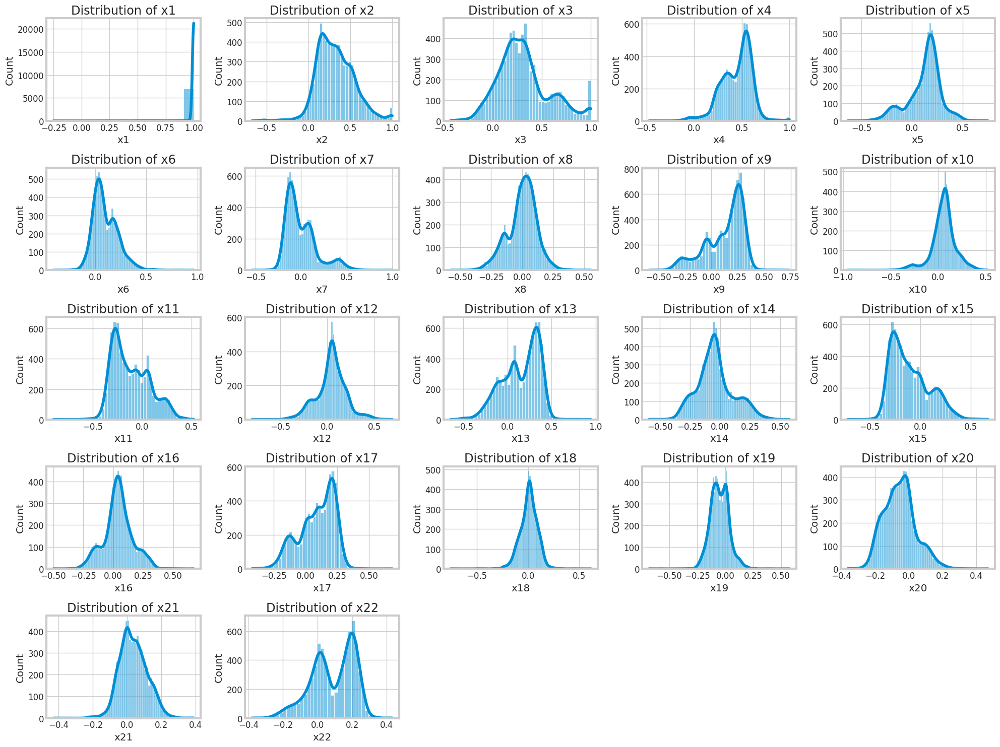

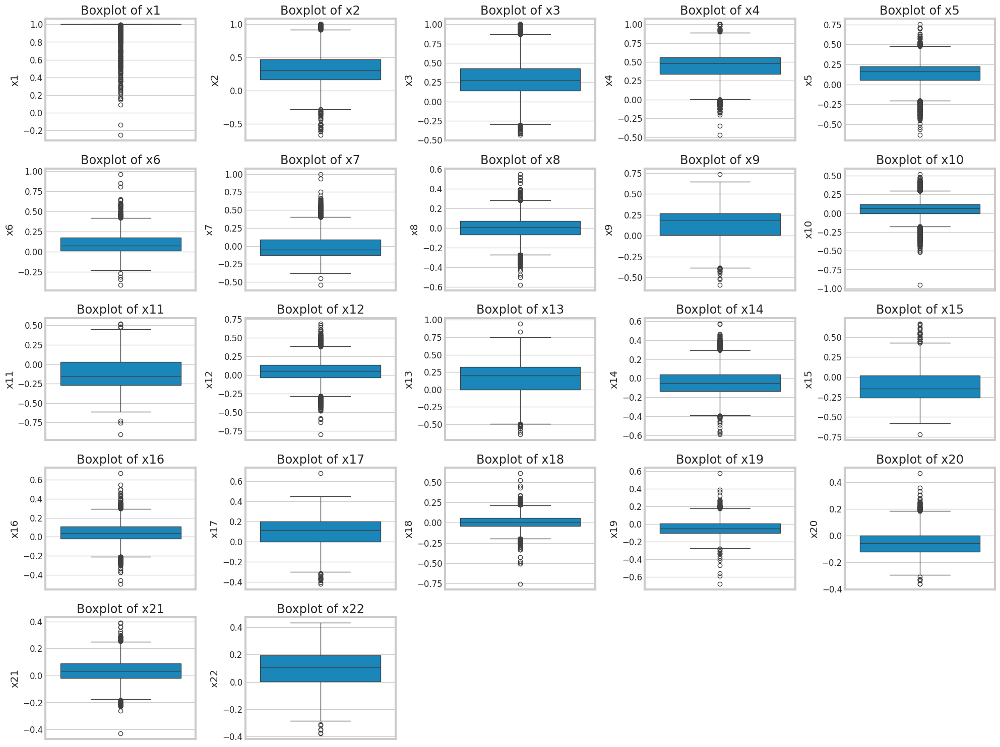

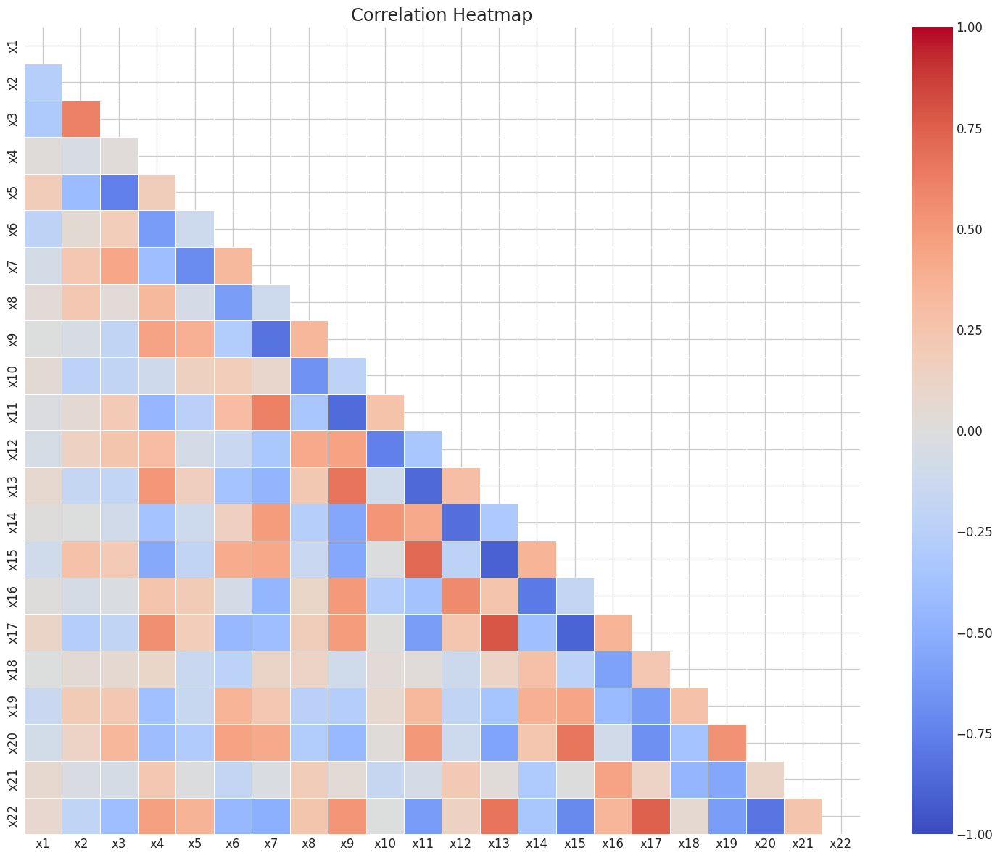

In [109]:
# Statistik deskriptif
print("Descriptive Statistics:")
df_stats = df.describe().T
df_stats['range'] = df_stats['max'] - df_stats['min']
print(df_stats)

# Cek missing values
missing_values = df.isnull().sum()
print("Missing values:")
print(missing_values.sum(), "missing values found.")

# Visualisasi distribusi fitur
plt.figure(figsize=(20, 15))
for i, column in enumerate(df.columns):
    plt.subplot(5, 5, i+1)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.tight_layout()
plt.show()

# Boxplot untuk mendeteksi outliers
plt.figure(figsize=(20, 15))
for i, column in enumerate(df.columns):
    plt.subplot(5, 5, i+1)
    sns.boxplot(y=df[column])
    plt.title(f'Boxplot of {column}')
    plt.tight_layout()
plt.show()

# Heatmap untuk korelasi antar fitur
plt.figure(figsize=(15, 12))
correlation = df.corr()
mask = np.triu(np.ones_like(correlation, dtype=bool))
sns.heatmap(correlation, mask=mask, annot=False, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

### 2.2 Normalisasi Data

Sebelum melakukan clustering, kita perlu menstandarisasi data karena algoritma clustering sensitif terhadap skala fitur. Standardisasi akan membuat mean = 0 dan standard deviation = 1 untuk setiap fitur.

Statistics after standardization:
      count          mean       std        min       25%       50%       75%  \
x1   7195.0 -3.476178e-16  1.000069 -17.983627  0.146578  0.146578  0.146578   
x2   7195.0  1.580081e-16  1.000069  -4.558260 -0.721003 -0.097879  0.653969   
x3   7195.0 -3.160162e-17  1.000069  -2.835774 -0.655685 -0.138890  0.453383   
x4   7195.0 -3.318170e-16  1.000069  -5.730376 -0.681531  0.221226  0.710245   
x5   7195.0 -9.480487e-17  1.000069  -4.689655 -0.462961  0.210893  0.587210   
x6   7195.0 -6.320325e-17  1.000069  -4.222105 -0.708930 -0.214777  0.647969   
x7   7195.0 -1.580081e-17  1.000069  -3.136579 -0.725473 -0.298922  0.507472   
x8   7195.0  6.320325e-17  1.000069  -4.954132 -0.539484  0.117246  0.649024   
x9   7195.0 -7.900406e-17  1.000069  -3.997445 -0.690322  0.341370  0.766394   
x10  7195.0  3.950203e-17  1.000069  -7.933425 -0.449524  0.058854  0.485694   
x11  7195.0  6.320325e-17  1.000069  -4.209824 -0.825457 -0.201517  0.762245   
x12  7

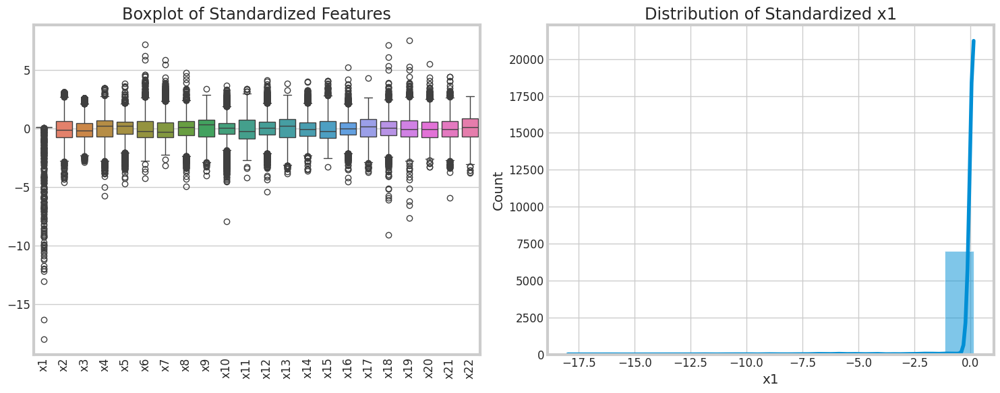

In [110]:
# Standardisasi data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)
df_scaled = pd.DataFrame(scaled_data, columns=df.columns)

# Tampilkan statistik data yang telah distandarisasi
print("Statistics after standardization:")
print(df_scaled.describe().T)

# Visualisasi data yang telah distandarisasi
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
sns.boxplot(data=df_scaled)
plt.title('Boxplot of Standardized Features')
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.histplot(df_scaled.iloc[:, 0], kde=True)
plt.title(f'Distribution of Standardized {df.columns[0]}')
plt.tight_layout()
plt.show()

### 2.3 Reduksi Dimensi dengan PCA untuk Visualisasi

Karena dataset memiliki 22 dimensi, kita akan menggunakan PCA untuk mereduksi dimensi menjadi 2D dan 3D untuk visualisasi.

Variance explained by PC1: 0.3480
Variance explained by PC2: 0.1500
Total variance explained: 0.4980


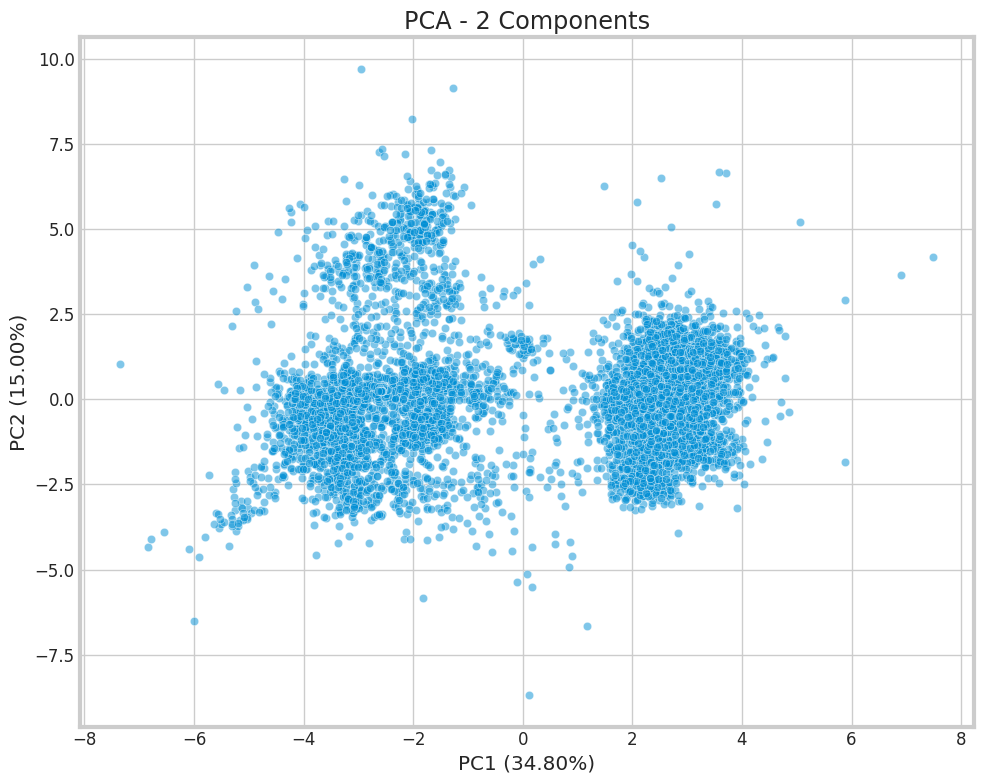

Variance explained by PC1: 0.3480
Variance explained by PC2: 0.1500
Variance explained by PC3: 0.1135
Total variance explained: 0.6116


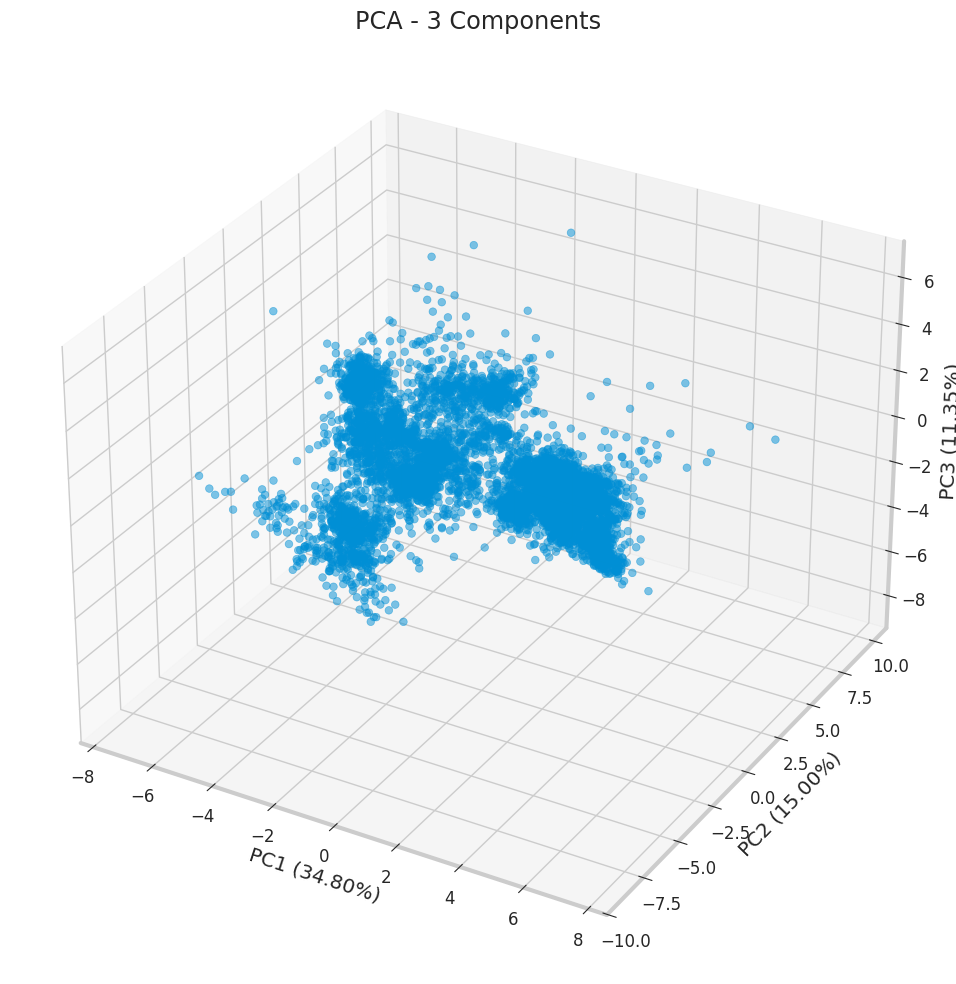

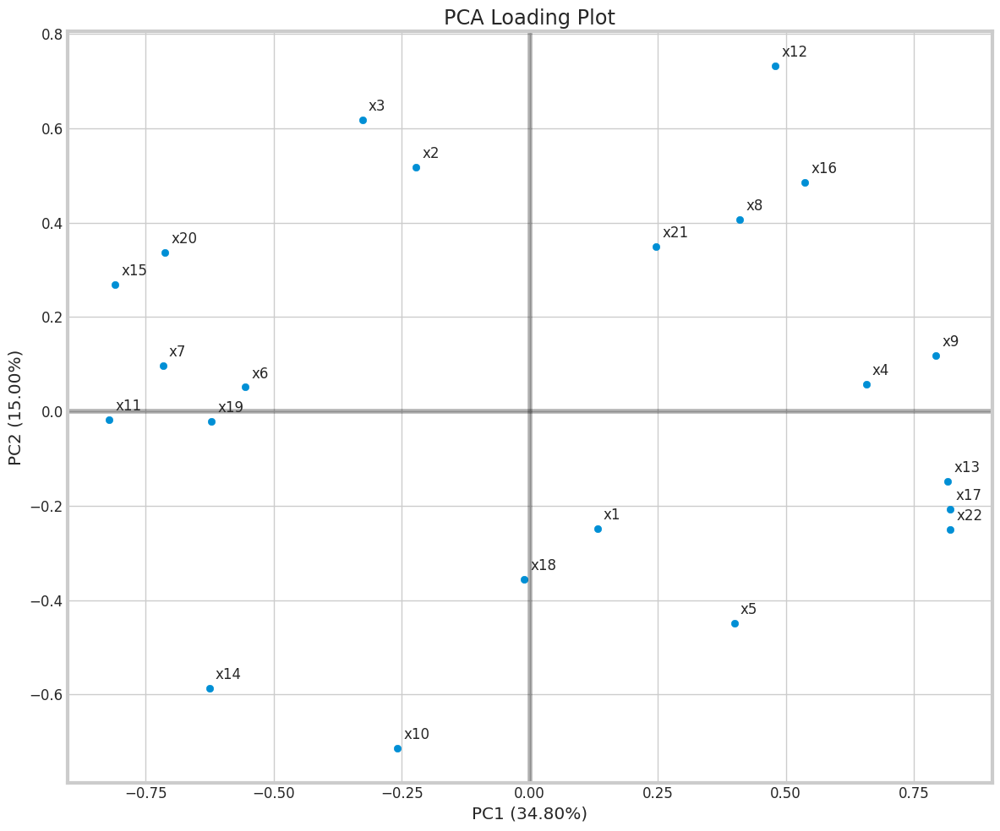

In [111]:
# PCA 2D untuk visualisasi
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)
df_pca = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Lihat hasil PCA dan variance explained
print(f"Variance explained by PC1: {pca.explained_variance_ratio_[0]:.4f}")
print(f"Variance explained by PC2: {pca.explained_variance_ratio_[1]:.4f}")
print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.4f}")

# Visualisasi hasil PCA 2D
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', data=df_pca, alpha=0.5)
plt.title('PCA - 2 Components')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.grid(True)
plt.tight_layout()
plt.show()

# PCA 3D untuk visualisasi lebih kompleks
pca3d = PCA(n_components=3)
pca3d_result = pca3d.fit_transform(scaled_data)
df_pca3d = pd.DataFrame(data=pca3d_result, columns=['PC1', 'PC2', 'PC3'])

# Lihat hasil PCA 3D dan variance explained
print(f"Variance explained by PC1: {pca3d.explained_variance_ratio_[0]:.4f}")
print(f"Variance explained by PC2: {pca3d.explained_variance_ratio_[1]:.4f}")
print(f"Variance explained by PC3: {pca3d.explained_variance_ratio_[2]:.4f}")
print(f"Total variance explained: {sum(pca3d.explained_variance_ratio_):.4f}")

# Visualisasi hasil PCA 3D menggunakan scatter plot 3D
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_pca3d['PC1'], df_pca3d['PC2'], df_pca3d['PC3'], alpha=0.5, s=30)
ax.set_title('PCA - 3 Components')
ax.set_xlabel(f'PC1 ({pca3d.explained_variance_ratio_[0]:.2%})')
ax.set_ylabel(f'PC2 ({pca3d.explained_variance_ratio_[1]:.2%})')
ax.set_zlabel(f'PC3 ({pca3d.explained_variance_ratio_[2]:.2%})')
plt.tight_layout()
plt.show()

# Analisis komponen PCA - Loading plot
loadings = pd.DataFrame(
    data=pca.components_.T * np.sqrt(pca.explained_variance_),
    columns=['PC1', 'PC2'],
    index=df.columns
)

plt.figure(figsize=(12, 10))
plt.scatter(loadings['PC1'], loadings['PC2'])
plt.title('PCA Loading Plot')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)
plt.grid(True)

# Anotasi loading plot dengan nama fitur
for i, feature in enumerate(df.columns):
    plt.annotate(feature, xy=(loadings.iloc[i, 0], loadings.iloc[i, 1]), xytext=(5, 5),
                 textcoords='offset points', ha='left', va='bottom')

plt.tight_layout()
plt.show()

## 3. Model Clustering

Kita akan mengimplementasikan dua model clustering berbeda:
1. K-Means Clustering
2. Hierarchical Clustering (Agglomerative)

Untuk setiap model, kita akan mengevaluasi menggunakan berbagai metrik seperti Elbow Method, Silhouette Coefficient, Calinski-Harabasz Index, Davies-Bouldin Index, dan Dunn Index.

### 3.1 K-Means Clustering

#### 3.1.1 Penjelasan Matematis K-Means

K-means adalah algoritma clustering yang bertujuan untuk mempartisi n observasi ke dalam k cluster, dengan setiap observasi termasuk dalam cluster dengan mean (centroid) terdekat. Matematikanya didefinisikan sebagai berikut:

$$\min_{S} \sum_{i=1}^{k} \sum_{\mathbf{x} \in S_i} \|\mathbf{x} - oldsymbol{\mu}_i\|^2$$

dimana:
- $S = \{S_1, S_2, ..., S_k\}$ adalah set dari $k$ cluster
- $\mathbf{x}$ adalah titik data dalam cluster $S_i$
- $oldsymbol{\mu}_i$ adalah centroid (mean) dari cluster $S_i$
- $\|\mathbf{x} - oldsymbol{\mu}_i\|^2$ adalah jarak Euclidean kuadrat antara titik data $\mathbf{x}$ dan centroid $oldsymbol{\mu}_i$

K-means bekerja melalui optimisasi iteratif untuk meminimalkan Within-Cluster Sum of Squares (WCSS):

1. Inisialisasi $k$ centroid secara acak dari data
2. Iterasi sampai konvergen:
   - Tugaskan setiap titik data ke centroid terdekat:
     $S_i^{(t)} = \{\mathbf{x} : \|\mathbf{x} - oldsymbol{\mu}_i^{(t)}\|^2 \leq \|\mathbf{x} - oldsymbol{\mu}_j^{(t)}\|^2 \,
orall j, 1 \leq j \leq k\}$
   - Perbarui centroid:
     $oldsymbol{\mu}_i^{(t+1)} =
rac{1}{|S_i^{(t)}|} \sum_{\mathbf{x} \in S_i^{(t)}} \mathbf{x}$

#### 3.1.2 Elbow Method

Elbow Method adalah teknik untuk menentukan jumlah cluster optimal dalam K-means. Prinsipnya adalah menjalankan algoritma K-means dengan berbagai nilai $k$ dan menghitung Within-Cluster Sum of Squares (WCSS) untuk setiap nilai $k$.

$$	ext{WCSS} = \sum_{i=1}^{k} \sum_{\mathbf{x} \in S_i} \|\mathbf{x} - oldsymbol{\mu}_i\|^2$$

Plot WCSS vs. $k$ biasanya menunjukkan "siku" (elbow) di mana penambahan cluster lebih lanjut memberikan penurunan WCSS yang relatif kecil, menunjukkan jumlah cluster optimal.

#### 3.1.3 Silhouette Coefficient

Silhouette Coefficient mengukur seberapa baik setiap titik dikelompokkan dengan menghitung jarak rata-rata titik ke titik lain dalam cluster yang sama (cohesion) dibandingkan dengan jarak rata-rata ke titik di cluster terdekat (separation).

Untuk setiap titik $i$, silhouette coefficient dihitung sebagai:

$$s(i) =
rac{b(i) - a(i)}{\max\{a(i), b(i)\}}$$

dimana:
- $a(i)$ adalah jarak rata-rata titik $i$ ke semua titik lain dalam cluster yang sama
- $b(i)$ adalah jarak rata-rata minimum dari titik $i$ ke titik-titik di cluster terdekat lainnya

Silhouette Coefficient berkisar dari -1 hingga 1, dengan nilai yang lebih tinggi menunjukkan bahwa titik tersebut cocok dengan baik dalam cluster-nya dan jauh dari cluster lain.

K=2: WCSS=108667.95, Silhouette=0.3298, Calinski-Harabasz=3284.61, Davies-Bouldin=1.3081
K=3: WCSS=94587.62, Silhouette=0.3565, Calinski-Harabasz=2421.82, Davies-Bouldin=1.4446
K=4: WCSS=84509.19, Silhouette=0.3594, Calinski-Harabasz=2092.70, Davies-Bouldin=1.3202
K=5: WCSS=75684.10, Silhouette=0.3543, Calinski-Harabasz=1961.89, Davies-Bouldin=1.3474
K=6: WCSS=67624.61, Silhouette=0.2734, Calinski-Harabasz=1927.68, Davies-Bouldin=1.3753
K=7: WCSS=62063.14, Silhouette=0.2835, Calinski-Harabasz=1857.46, Davies-Bouldin=1.3070
K=8: WCSS=58251.52, Silhouette=0.2922, Calinski-Harabasz=1763.23, Davies-Bouldin=1.2593
K=9: WCSS=54354.07, Silhouette=0.2989, Calinski-Harabasz=1717.63, Davies-Bouldin=1.2770
K=10: WCSS=51882.73, Silhouette=0.2540, Calinski-Harabasz=1637.32, Davies-Bouldin=1.3642
K=11: WCSS=48957.51, Silhouette=0.2933, Calinski-Harabasz=1604.34, Davies-Bouldin=1.2610
K=12: WCSS=46506.78, Silhouette=0.2490, Calinski-Harabasz=1569.55, Davies-Bouldin=1.3356
K=13: WCSS=44608.56, Silhoue

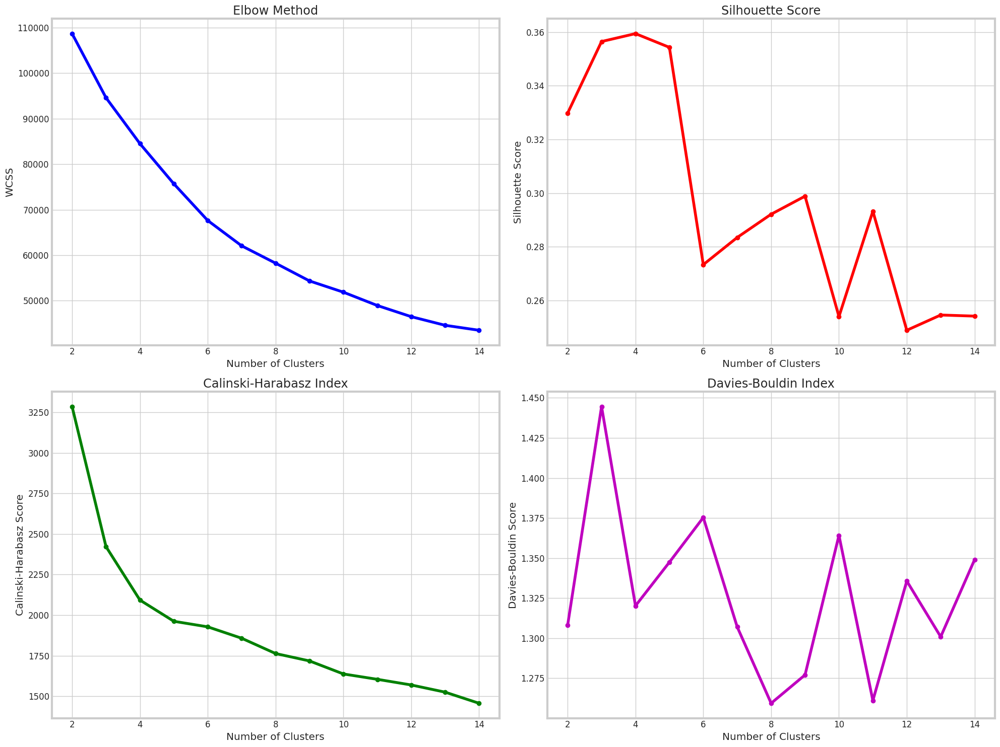

Optimal k based on Silhouette Score: 4
Optimal k based on Calinski-Harabasz Index: 2
Optimal k based on Davies-Bouldin Index: 8
Chosen optimal k: 4


In [112]:
# Tentukan range jumlah cluster untuk dievaluasi
k_range = range(2, 15)

# Inisialisasi list untuk menyimpan hasil metrik
wcss = []
silhouette_scores = []
calinski_scores = []
davies_scores = []

# Hitung metrik untuk setiap nilai k
for k in k_range:
    # Fit K-means
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(scaled_data)

    # Simpan WCSS
    wcss.append(kmeans.inertia_)

    # Hitung Silhouette Score
    labels = kmeans.labels_
    silhouette = silhouette_score(scaled_data, labels)
    silhouette_scores.append(silhouette)

    # Hitung Calinski-Harabasz Index
    calinski = calinski_harabasz_score(scaled_data, labels)
    calinski_scores.append(calinski)

    # Hitung Davies-Bouldin Index
    davies = davies_bouldin_score(scaled_data, labels)
    davies_scores.append(davies)

    print(f"K={k}: WCSS={kmeans.inertia_:.2f}, Silhouette={silhouette:.4f}, "
          f"Calinski-Harabasz={calinski:.2f}, Davies-Bouldin={davies:.4f}")

# Visualisasi metrik evaluasi
plt.figure(figsize=(20, 15))

# Elbow Method
plt.subplot(2, 2, 1)
plt.plot(k_range, wcss, 'bo-')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)

# Silhouette Score
plt.subplot(2, 2, 2)
plt.plot(k_range, silhouette_scores, 'ro-')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.grid(True)

# Calinski-Harabasz Index
plt.subplot(2, 2, 3)
plt.plot(k_range, calinski_scores, 'go-')
plt.title('Calinski-Harabasz Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Calinski-Harabasz Score')
plt.grid(True)

# Davies-Bouldin Index
plt.subplot(2, 2, 4)
plt.plot(k_range, davies_scores, 'mo-')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Score')
plt.grid(True)

plt.tight_layout()
plt.show()

# Identifikasi jumlah cluster optimal berdasarkan metrik evaluasi
optimal_k_silhouette = k_range[np.argmax(silhouette_scores)]
optimal_k_calinski = k_range[np.argmax(calinski_scores)]
optimal_k_davies = k_range[np.argmin(davies_scores)]  # Nilai lebih rendah lebih baik untuk Davies-Bouldin

print(f"Optimal k based on Silhouette Score: {optimal_k_silhouette}")
print(f"Optimal k based on Calinski-Harabasz Index: {optimal_k_calinski}")
print(f"Optimal k based on Davies-Bouldin Index: {optimal_k_davies}")

# Penentuan jumlah cluster optimal berdasarkan pertimbangan semua metrik
# Untuk contoh ini, anggaplah kita memilih berdasarkan silhouette score
optimal_k = optimal_k_silhouette
print(f"Chosen optimal k: {optimal_k}")

### 3.1.4 Implementasi K-Means dengan Jumlah Cluster Optimal

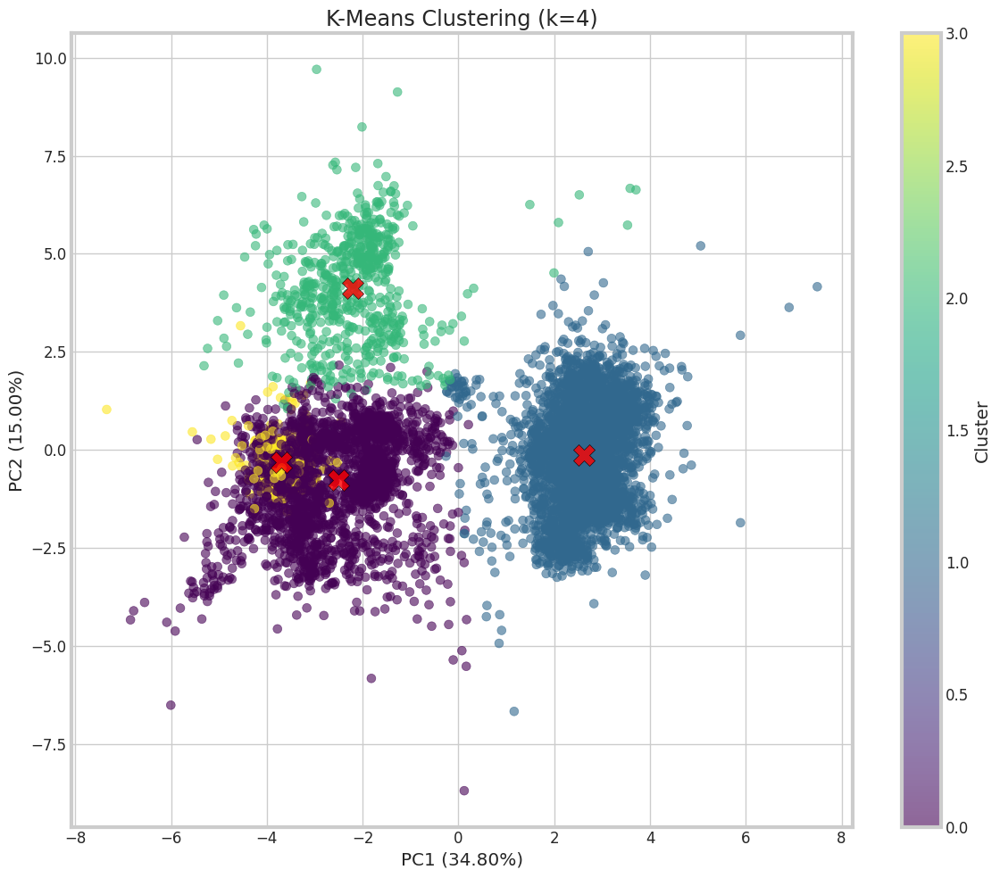

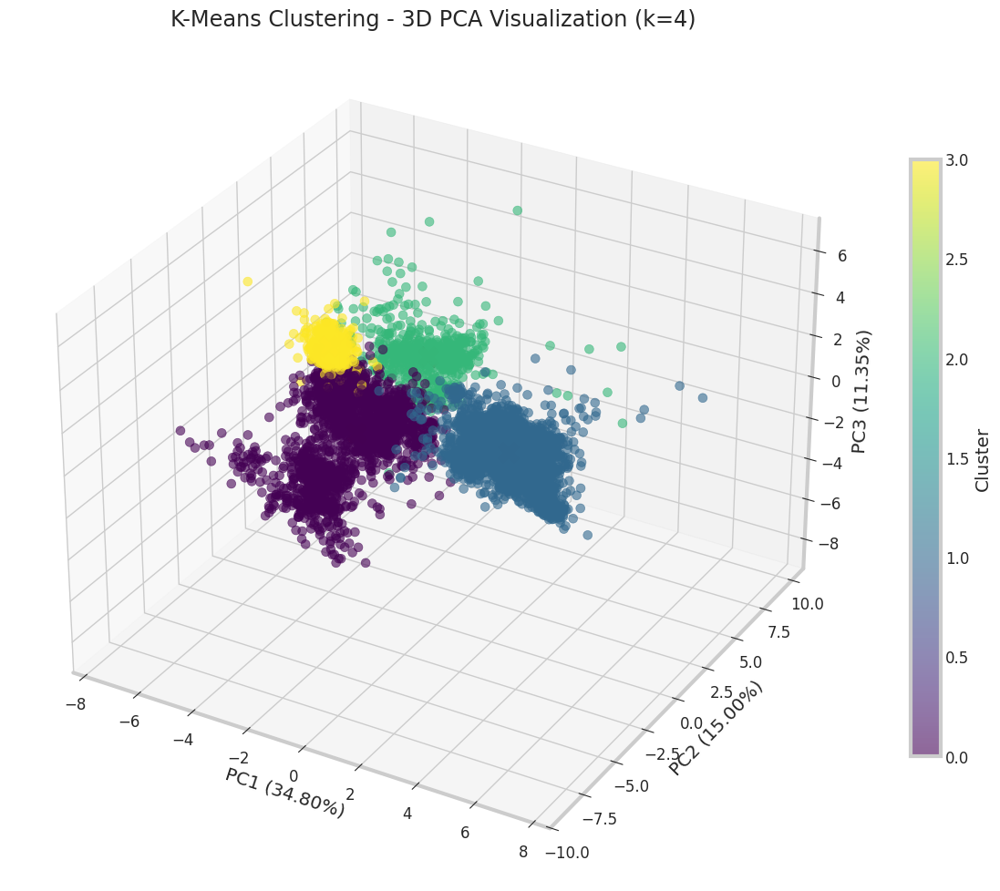

In [113]:
# Terapkan K-Means dengan jumlah cluster optimal
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
kmeans_labels = kmeans_optimal.fit_predict(scaled_data)

# Tambahkan label cluster ke dataframe
df['KMeans_Cluster'] = kmeans_labels
df_pca['KMeans_Cluster'] = kmeans_labels
df_pca3d['KMeans_Cluster'] = kmeans_labels

# Visualisasi hasil cluster pada plot PCA 2D
plt.figure(figsize=(12, 10))
scatter = plt.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['KMeans_Cluster'],
                   cmap='viridis', alpha=0.6, s=50)

# Plot centroids
centroids_pca = pca.transform(kmeans_optimal.cluster_centers_)
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1],
         c='red', s=300, alpha=0.8, marker='X', edgecolors='black')

plt.title(f'K-Means Clustering (k={optimal_k})')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter, label='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualisasi hasil cluster pada plot PCA 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df_pca3d['PC1'],
    df_pca3d['PC2'],
    df_pca3d['PC3'],
    c=df_pca3d['KMeans_Cluster'],
    cmap='viridis',
    alpha=0.6,
    s=50
)

# Plot centroids dalam 3D
centroids_pca3d = pca3d.transform(kmeans_optimal.cluster_centers_)
ax.scatter(
    centroids_pca3d[:, 0],
    centroids_pca3d[:, 1],
    centroids_pca3d[:, 2],
    c='red',
    s=300,
    alpha=0.8,
    marker='X',
    edgecolors='black'
)

ax.set_title(f'K-Means Clustering - 3D PCA Visualization (k={optimal_k})')
ax.set_xlabel(f'PC1 ({pca3d.explained_variance_ratio_[0]:.2%})')
ax.set_ylabel(f'PC2 ({pca3d.explained_variance_ratio_[1]:.2%})')
ax.set_zlabel(f'PC3 ({pca3d.explained_variance_ratio_[2]:.2%})')
plt.colorbar(scatter, label='Cluster', ax=ax, shrink=0.7)
plt.tight_layout()
plt.show()

### 3.1.5 Analisis Karakteristik Cluster K-Means

Setelah menerapkan clustering, kita perlu menganalisis karakteristik setiap cluster untuk memahami pola tersembunyi dalam data.

Cluster Statistics:
Cluster sizes: [2567 3574  631  423]
Cluster Means:
                      x1        x2        x3        x4        x5        x6  \
KMeans_Cluster                                                               
0               0.998946  0.270119  0.273911  0.296856  0.136607  0.191066   
1               0.998539  0.276604  0.217336  0.553768  0.188358  0.028002   
2               0.902996  0.671132  0.760516  0.389345 -0.046472  0.192131   
3               0.991386  0.526534  0.660721  0.525002 -0.190166 -0.016800   

                      x7        x8        x9       x10  ...       x13  \
KMeans_Cluster                                          ...             
0               0.079036 -0.090706  0.003425  0.120952  ...  0.014326   
1              -0.114829  0.046695  0.259888  0.032573  ...  0.314551   
2               0.034656  0.075979  0.159456 -0.145432  ... -0.070264   
3               0.415117  0.036285 -0.273651  0.160226  ... -0.072335   

                    

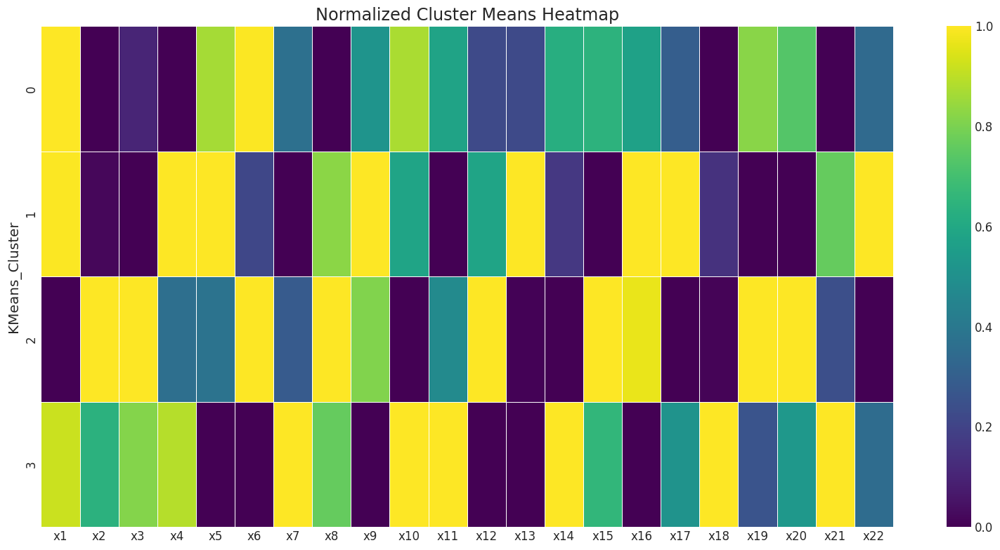

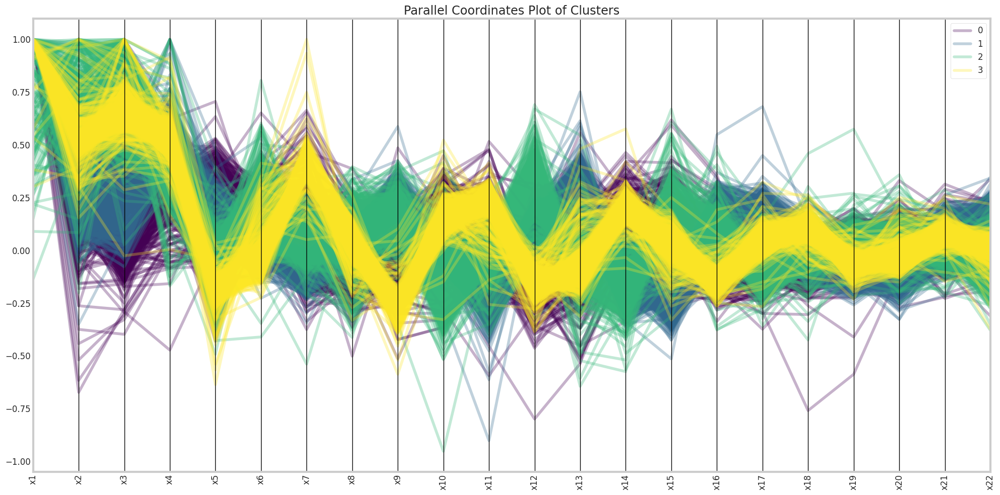

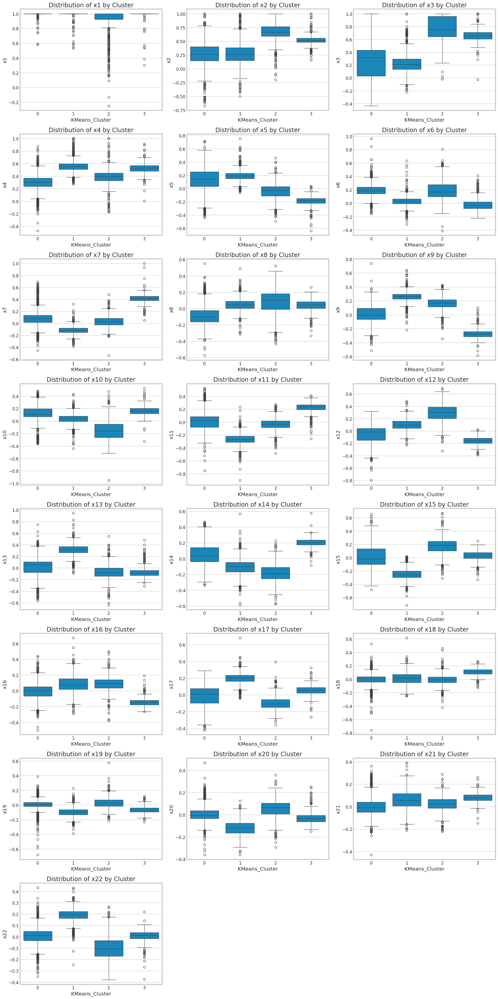

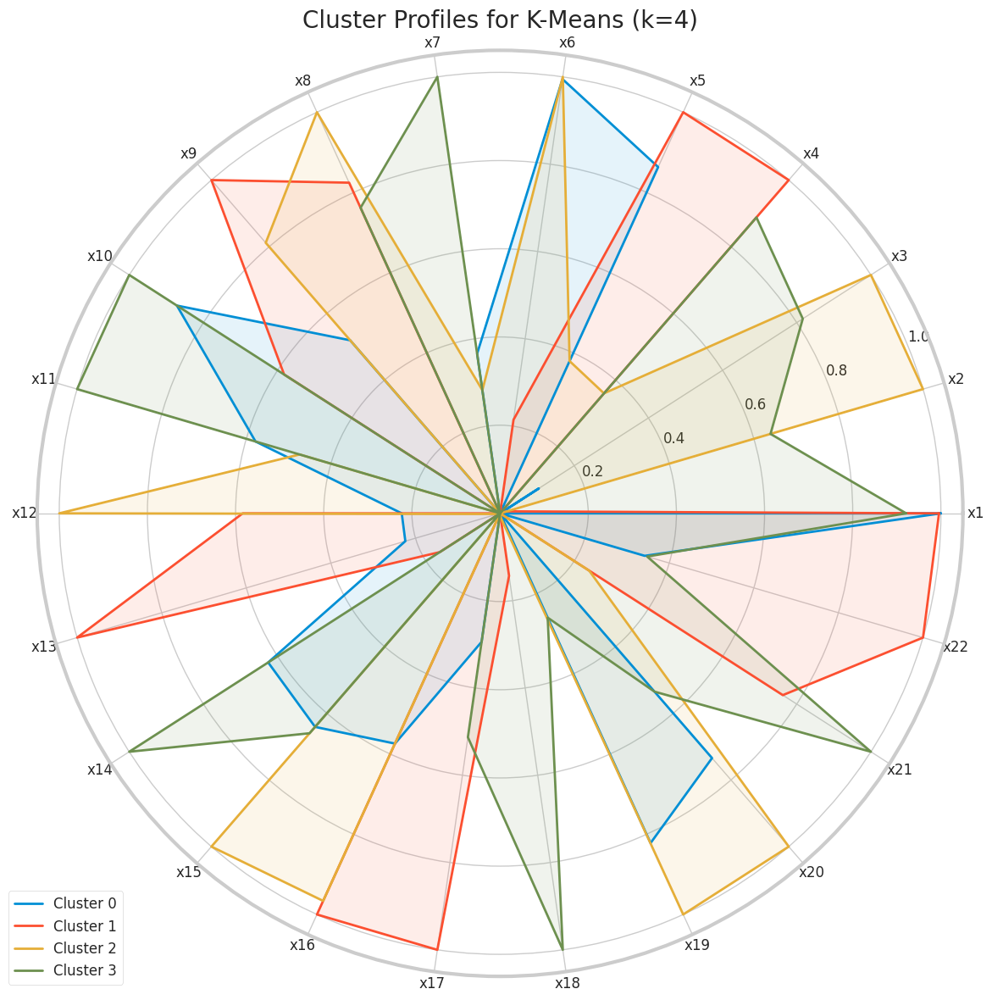

In [114]:
# Analisis statistik per cluster
cluster_stats = df.groupby('KMeans_Cluster').agg([
    'mean', 'median', 'min', 'max', 'std', 'count'
])

print("Cluster Statistics:")
print(f"Cluster sizes: {df['KMeans_Cluster'].value_counts().sort_index().values}")

# Simpan statistik ke file CSV untuk analisis lebih lanjut jika diperlukan
# cluster_stats.to_csv('kmeans_cluster_stats.csv')

# Untuk ringkasan yang lebih ringkas, kita hanya tunjukkan nilai mean
cluster_means = df.groupby('KMeans_Cluster').mean()
print("Cluster Means:")
print(cluster_means)

# Visualisasi karakteristik cluster dengan heatmap
plt.figure(figsize=(16, 8))
# Normalisasi nilai mean untuk visualisasi yang lebih baik
cluster_means_norm = (cluster_means - cluster_means.min()) / (cluster_means.max() - cluster_means.min())
sns.heatmap(cluster_means_norm, annot=False, cmap='viridis', linewidths=0.5)
plt.title('Normalized Cluster Means Heatmap')
plt.tight_layout()
plt.show()

# Pola fitur per cluster dengan parallel coordinates plot
from pandas.plotting import parallel_coordinates

# Ambil sampel dari setiap cluster untuk parallel coordinates plot
sample_size = min(500, len(df) // optimal_k)  # Batasi sampel untuk plot yang lebih jelas
df_sample = pd.DataFrame()

for cluster in range(optimal_k):
    cluster_data = df[df['KMeans_Cluster'] == cluster].copy()
    if len(cluster_data) > sample_size:
        cluster_sample = cluster_data.sample(sample_size, random_state=42)
    else:
        cluster_sample = cluster_data
    df_sample = pd.concat([df_sample, cluster_sample])

# Buat parallel coordinates plot
plt.figure(figsize=(20, 10))
parallel_coordinates(df_sample, 'KMeans_Cluster', colormap='viridis', alpha=0.3)
plt.title('Parallel Coordinates Plot of Clusters')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Visualisasi boxplot untuk setiap fitur berdasarkan cluster
n_features = len(df.columns) - 1  # Kurangi 1 untuk kolom cluster
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

plt.figure(figsize=(20, 5 * n_rows))
for i, feature in enumerate(df.columns[:-1]):
    plt.subplot(n_rows, n_cols, i+1)
    sns.boxplot(x='KMeans_Cluster', y=feature, data=df)
    plt.title(f'Distribution of {feature} by Cluster')
    plt.tight_layout()
plt.show()

# Radar chart untuk perbandingan profil cluster
def make_radar_chart(df_means, title):
    # Normalisasi nilai untuk radar chart
    df_norm = (df_means - df_means.min()) / (df_means.max() - df_means.min())

    # Jumlah variabel
    categories = df_norm.columns
    N = len(categories)

    # Set sudut untuk setiap variabel
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]

    # Buat radar chart
    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))

    # Gambar satu garis untuk setiap cluster
    for i, idx in enumerate(df_norm.index):
        values = df_norm.loc[idx].values.flatten().tolist()
        values += values[:1]
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'Cluster {idx}')
        ax.fill(angles, values, alpha=0.1)

    # Tambahkan label untuk setiap variabel
    plt.xticks(angles[:-1], categories, fontsize=12)

    # Tambahkan title dan legend
    plt.title(title, size=20, pad=20)
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    return fig, ax

# Buat radar chart untuk membandingkan profil cluster
fig, ax = make_radar_chart(cluster_means, f"Cluster Profiles for K-Means (k={optimal_k})")
plt.tight_layout()
plt.show()

## 3.2 Hierarchical Clustering (Agglomerative)

### 3.2.1 Penjelasan Matematis Hierarchical Clustering

Hierarchical clustering membangun hirarki cluster dengan pendekatan bottom-up (agglomerative) atau top-down (divisive). Kita akan fokus pada agglomerative clustering yang dimulai dengan setiap titik data sebagai cluster individual, lalu secara berulang menggabungkan pasangan cluster terdekat.

Proses penggabungan cluster melibatkan perhitungan jarak antar-cluster. Beberapa metode umum untuk mendefinisikan jarak antar-cluster adalah:

1. **Single Linkage (Minimum Linkage)**:
   $$d(C_i, C_j) = \min_{x \in C_i, y \in C_j} d(x, y)$$
   Jarak antara dua cluster adalah jarak minimum antara dua titik dari masing-masing cluster.

2. **Complete Linkage (Maximum Linkage)**:
   $$d(C_i, C_j) = \max_{x \in C_i, y \in C_j} d(x, y)$$
   Jarak antara dua cluster adalah jarak maksimum antara dua titik dari masing-masing cluster.

3. **Average Linkage**:
   $$d(C_i, C_j) =
rac{1}{|C_i||C_j|} \sum_{x \in C_i} \sum_{y \in C_j} d(x, y)$$
   Jarak antara dua cluster adalah rata-rata jarak antara semua pasangan titik dari kedua cluster.

4. **Ward's Method**:
   $$d(C_i, C_j) = \sqrt{
rac{2|C_i||C_j|}{|C_i|+|C_j|}} \|oldsymbol{\mu}_i - oldsymbol{\mu}_j\|$$
   Meminimalkan peningkatan dalam sum of squared errors saat menggabungkan cluster. Di sini, $oldsymbol{\mu}_i$ adalah centroid dari cluster $C_i$.

Ward's method cenderung menghasilkan cluster dengan ukuran serupa dan merupakan pendekatan yang populer.

### 3.2.2 Dendrogram dan Pemilihan Jumlah Cluster

Dendrogram adalah representasi visual dari proses hierarchical clustering. Cabang horizontal menunjukkan cluster yang digabungkan, dan ketinggian cabang menunjukkan jarak antar-cluster saat digabungkan. Dendrogram berguna untuk menentukan jumlah cluster optimal dengan melihat "gap" vertikal terbesar.

### 3.2.3 Dunn Index

Dunn Index adalah metrik evaluasi clustering yang mengukur rasio jarak minimum antar-cluster (separation) dengan diameter maksimum cluster (compactness):

$$	ext{DI} =
rac{\min_{i
eq j} d(C_i, C_j)}{\max_{k} 	ext{diam}(C_k)}$$

di mana $d(C_i, C_j)$ adalah jarak antara cluster $C_i$ dan $C_j$, dan $	ext{diam}(C_k)$ adalah diameter cluster $C_k$ (jarak maksimum antara dua titik dalam cluster).

Nilai Dunn Index yang lebih tinggi mengindikasikan clustering yang lebih baik, dengan cluster yang lebih terpisah (separation tinggi) dan lebih kompak (compactness tinggi).

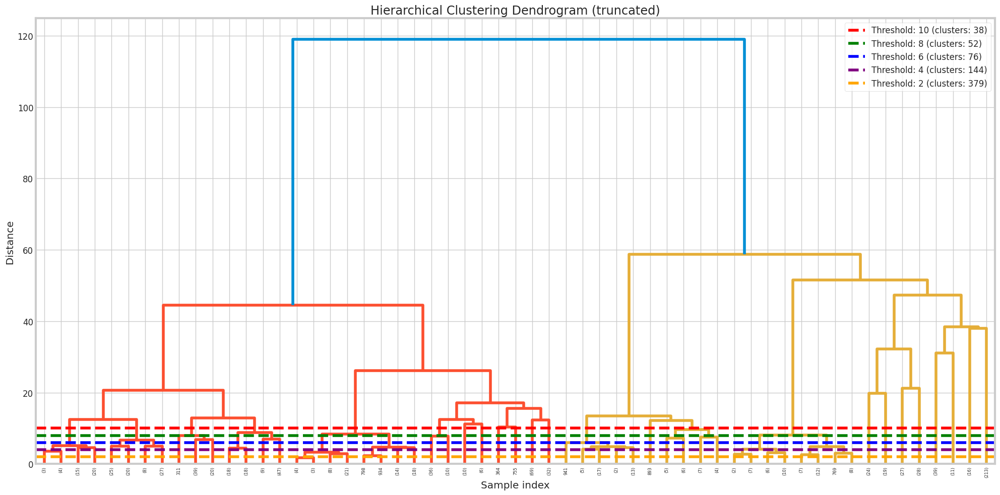

Hierarchical k=2: Silhouette=0.3238, Calinski-Harabasz=3191.76, Davies-Bouldin=1.3145, Dunn Index=0.049170
Hierarchical k=3: Silhouette=0.3492, Calinski-Harabasz=2329.63, Davies-Bouldin=1.4568, Dunn Index=0.054522
Hierarchical k=4: Silhouette=0.3474, Calinski-Harabasz=2015.22, Davies-Bouldin=1.5135, Dunn Index=0.056562
Hierarchical k=5: Silhouette=0.3485, Calinski-Harabasz=1874.10, Davies-Bouldin=1.3769, Dunn Index=0.056562
Hierarchical k=6: Silhouette=0.2498, Calinski-Harabasz=1800.50, Davies-Bouldin=1.4250, Dunn Index=0.034389
Hierarchical k=7: Silhouette=0.2615, Calinski-Harabasz=1730.66, Davies-Bouldin=1.3441, Dunn Index=0.034389
Hierarchical k=8: Silhouette=0.2650, Calinski-Harabasz=1653.49, Davies-Bouldin=1.3517, Dunn Index=0.034389
Hierarchical k=9: Silhouette=0.2683, Calinski-Harabasz=1567.08, Davies-Bouldin=1.3453, Dunn Index=0.040693
Hierarchical k=10: Silhouette=0.2757, Calinski-Harabasz=1510.19, Davies-Bouldin=1.5069, Dunn Index=0.042633
Hierarchical k=11: Silhouette=0.2814

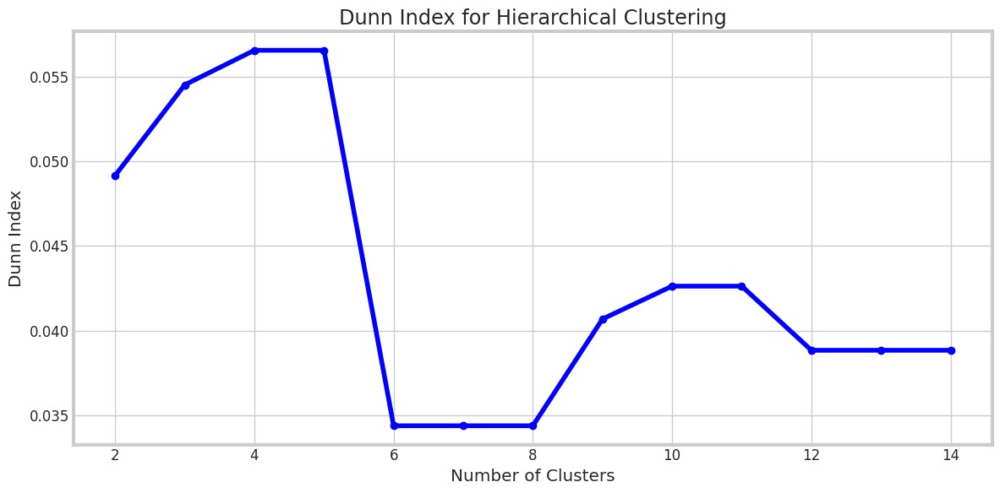

Optimal number of clusters based on Dunn Index: 4


In [97]:
# Implementasi Dunn Index untuk evaluasi
def dunn_index(X, labels):
    """Calculate Dunn Index for cluster evaluation"""
    unique_labels = np.unique(labels)

    # Calculate minimum inter-cluster distance
    min_inter_cluster_dist = float('inf')
    for i in range(len(unique_labels)):
        for j in range(i+1, len(unique_labels)):
            cluster_i = X[labels == unique_labels[i]]
            cluster_j = X[labels == unique_labels[j]]

            # Calculate pairwise distances between clusters
            dists = pairwise_distances(cluster_i, cluster_j, metric='euclidean')
            min_dist = np.min(dists)

            if min_dist < min_inter_cluster_dist:
                min_inter_cluster_dist = min_dist

    # Calculate maximum intra-cluster distance (cluster diameter)
    max_intra_cluster_dist = 0
    for i in range(len(unique_labels)):
        cluster_i = X[labels == unique_labels[i]]
        if len(cluster_i) > 1:  # Skip clusters with only one point
            dists = pairwise_distances(cluster_i, metric='euclidean')
            max_dist = np.max(dists)

            if max_dist > max_intra_cluster_dist:
                max_intra_cluster_dist = max_dist

    if max_intra_cluster_dist == 0:  # Avoid division by zero
        return 0

    return min_inter_cluster_dist / max_intra_cluster_dist

# Visualisasi dendrogram untuk menentukan jumlah cluster
# Untuk dataset yang besar, kita akan menggunakan sampel
np.random.seed(42)
sample_size = min(1000, len(scaled_data))  # Batasi sampel untuk dendrogram
sample_indices = np.random.choice(len(scaled_data), sample_size, replace=False)
sample_data = scaled_data[sample_indices]

# Hitung linkage matrix
linked = linkage(sample_data, method='ward')

plt.figure(figsize=(20, 10))
dendrogram(linked, truncate_mode='level', p=5)
plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('Sample index')
plt.ylabel('Distance')

# Tambahkan garis horizontal untuk menunjukkan potensi cutoff untuk jumlah cluster
thresholds = [10, 8, 6, 4, 2]
colors = ['red', 'green', 'blue', 'purple', 'orange']
for i, threshold in enumerate(thresholds):
    plt.axhline(y=threshold, c=colors[i], linestyle='--',
               label=f'Threshold: {threshold} (clusters: {len(np.unique(fcluster(linked, threshold, criterion="distance")))})')

plt.legend()
plt.tight_layout()
plt.show()

# Evaluasi berbagai jumlah cluster dengan metrik berbeda
dunn_scores = []

for k in k_range:
    # Fit Agglomerative Clustering
    hierarchical = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical.fit_predict(scaled_data)

    # Hitung metrik
    silhouette = silhouette_score(scaled_data, labels)
    calinski = calinski_harabasz_score(scaled_data, labels)
    davies = davies_bouldin_score(scaled_data, labels)
    dunn = dunn_index(scaled_data, labels)
    dunn_scores.append(dunn)

    print(f"Hierarchical k={k}: Silhouette={silhouette:.4f}, "
          f"Calinski-Harabasz={calinski:.2f}, Davies-Bouldin={davies:.4f}, "
          f"Dunn Index={dunn:.6f}")

# Visualisasi Dunn Index
plt.figure(figsize=(12, 6))
plt.plot(k_range, dunn_scores, 'bo-')
plt.title('Dunn Index for Hierarchical Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Dunn Index')
plt.grid(True)
plt.tight_layout()
plt.show()

# Tentukan jumlah cluster optimal untuk Hierarchical Clustering
optimal_k_hierarchical = k_range[np.argmax(dunn_scores)]
print(f"Optimal number of clusters based on Dunn Index: {optimal_k_hierarchical}")

### 3.2.4 Implementasi Hierarchical Clustering dengan Jumlah Cluster Optimal

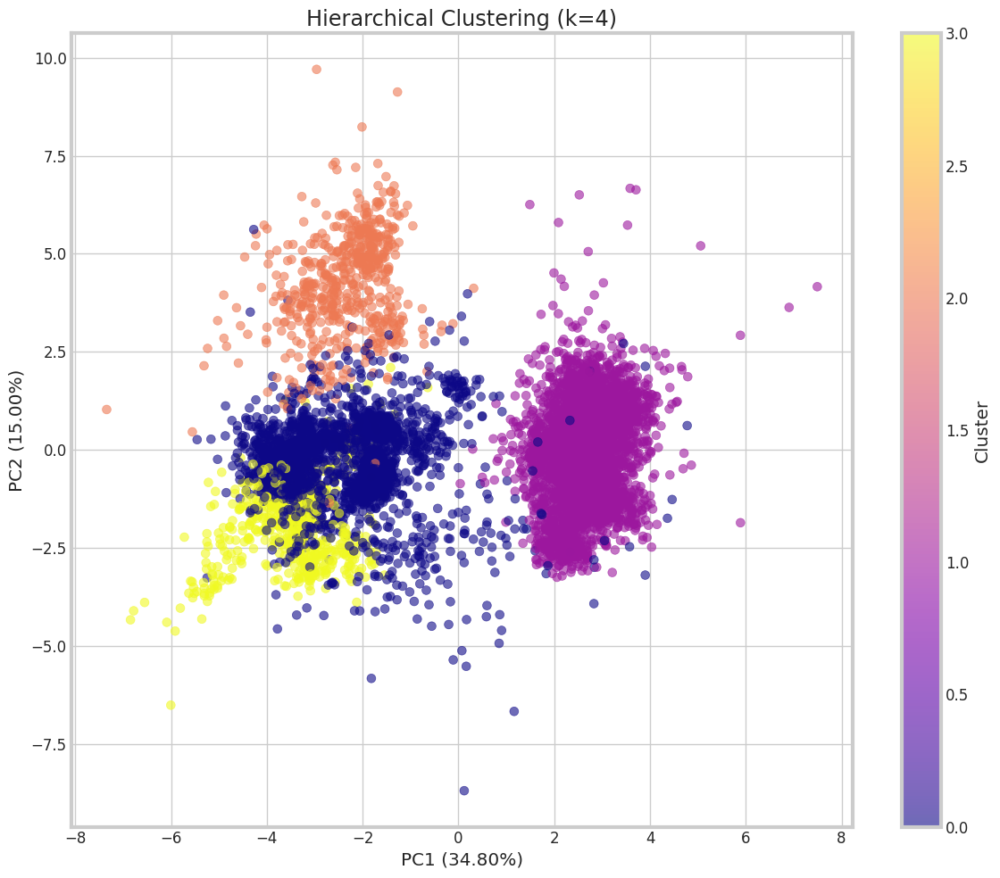

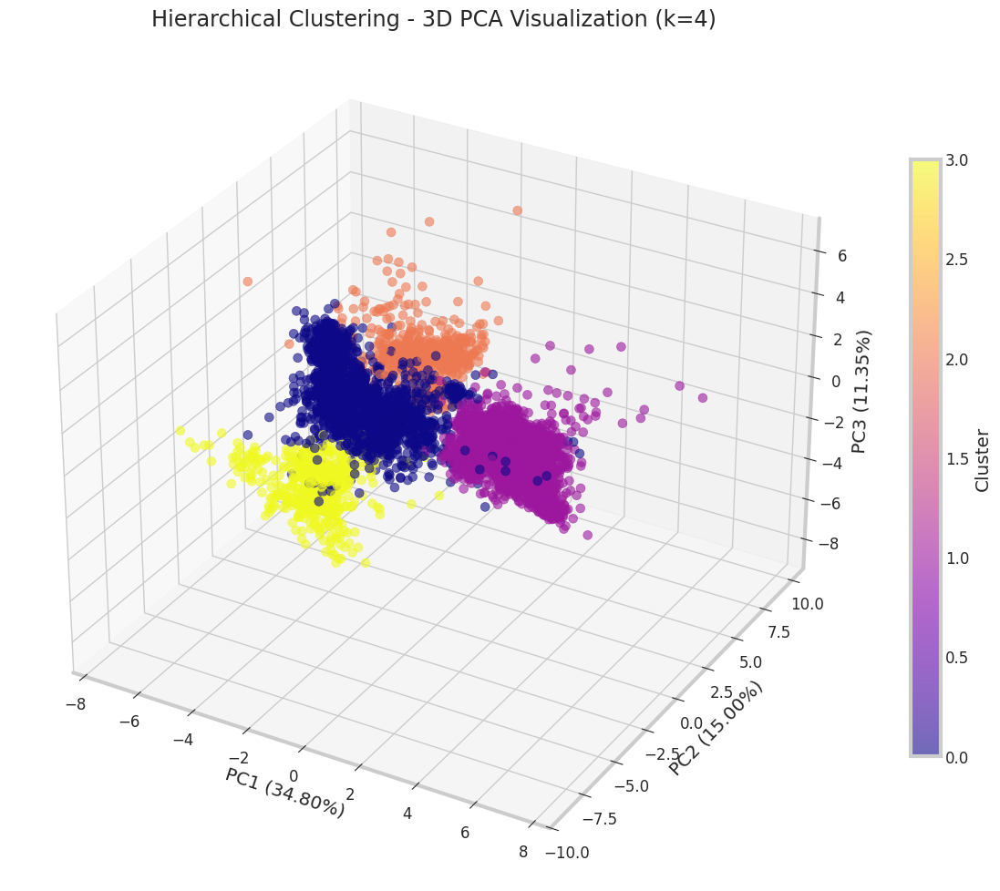

In [98]:
# Terapkan Agglomerative Clustering dengan jumlah cluster optimal
hierarchical_optimal = AgglomerativeClustering(n_clusters=optimal_k_hierarchical, linkage='ward')
hierarchical_labels = hierarchical_optimal.fit_predict(scaled_data)

# Tambahkan label cluster ke dataframe
df['Hierarchical_Cluster'] = hierarchical_labels
df_pca['Hierarchical_Cluster'] = hierarchical_labels
df_pca3d['Hierarchical_Cluster'] = hierarchical_labels

# Visualisasi hasil cluster pada plot PCA 2D
plt.figure(figsize=(12, 10))
scatter = plt.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['Hierarchical_Cluster'],
                      cmap='plasma', alpha=0.6, s=50)

plt.title(f'Hierarchical Clustering (k={optimal_k_hierarchical})')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter, label='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualisasi hasil cluster pada plot PCA 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df_pca3d['PC1'],
    df_pca3d['PC2'],
    df_pca3d['PC3'],
    c=df_pca3d['Hierarchical_Cluster'],
    cmap='plasma',
    alpha=0.6,
    s=50
)

ax.set_title(f'Hierarchical Clustering - 3D PCA Visualization (k={optimal_k_hierarchical})')
ax.set_xlabel(f'PC1 ({pca3d.explained_variance_ratio_[0]:.2%})')
ax.set_ylabel(f'PC2 ({pca3d.explained_variance_ratio_[1]:.2%})')
ax.set_zlabel(f'PC3 ({pca3d.explained_variance_ratio_[2]:.2%})')
plt.colorbar(scatter, label='Cluster', ax=ax, shrink=0.7)
plt.tight_layout()
plt.show()

### 3.2.5 Analisis Karakteristik Cluster Hierarchical

Hierarchical Cluster Statistics:
Cluster sizes: [2484 3478  583  650]
Hierarchical Cluster Means:
                            x1        x2        x3        x4        x5  \
Hierarchical_Cluster                                                     
0                     0.998287  0.323604  0.431015  0.353804  0.029643   
1                     0.998237  0.280400  0.212090  0.552590  0.187962   
2                     0.892981  0.679044  0.762556  0.381643 -0.053223   
3                     1.000000  0.235750 -0.020928  0.285682  0.335014   

                            x6        x7        x8        x9       x10  ...  \
Hierarchical_Cluster                                                    ...   
0                     0.147279  0.154866 -0.050415 -0.037328  0.091773  ...   
1                     0.027928 -0.115414  0.046221  0.261146  0.032197  ...   
2                     0.190063  0.043286  0.078046  0.154756 -0.148740  ...   
3                     0.201368 -0.028555 -0.128753  0.025735  

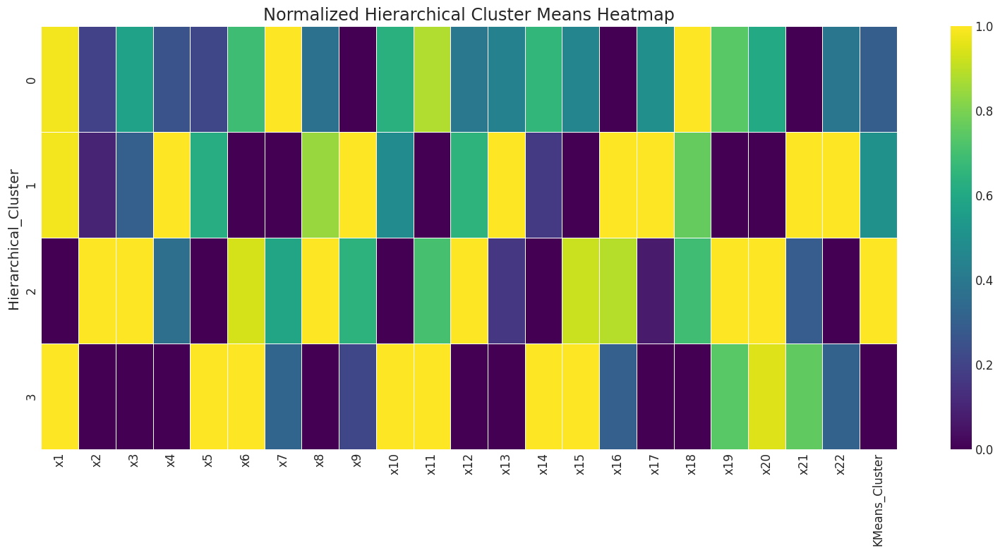

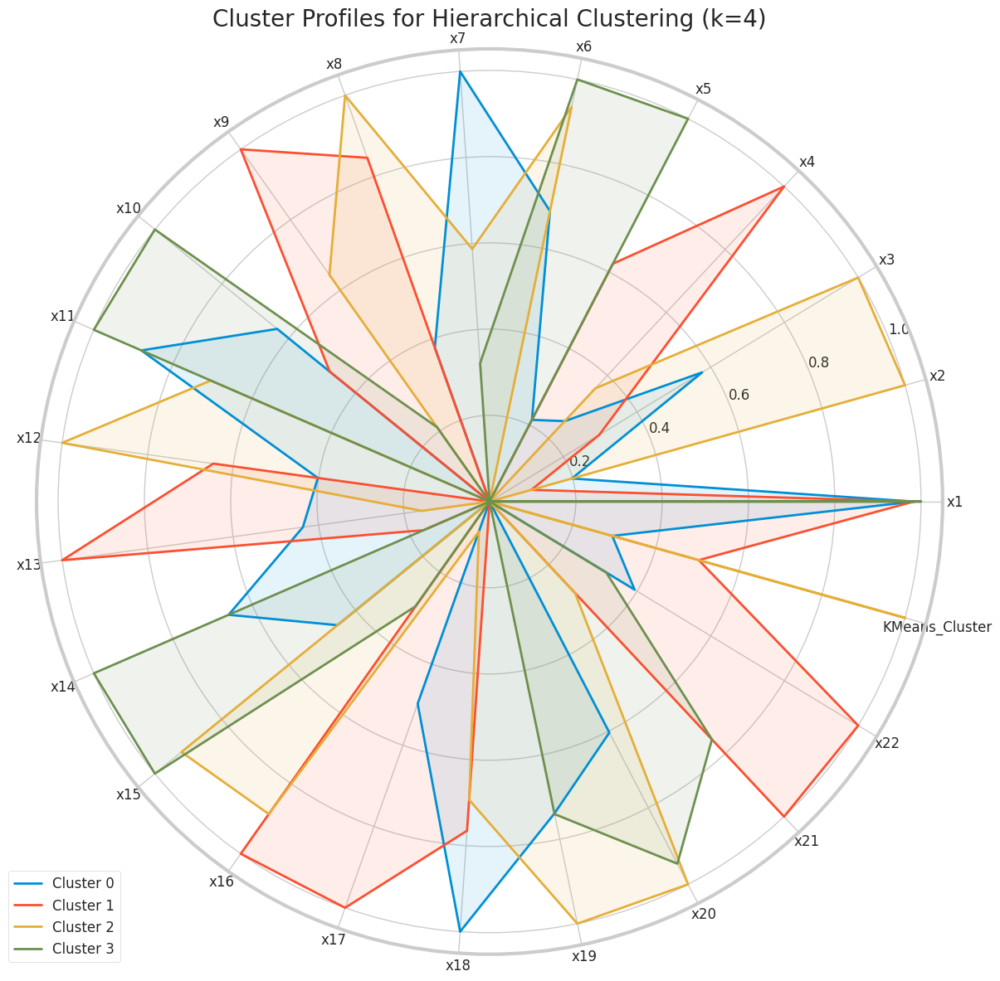

In [99]:
# Analisis statistik per cluster
hierarchical_stats = df.groupby('Hierarchical_Cluster').agg([
    'mean', 'median', 'min', 'max', 'std', 'count'
])

print("Hierarchical Cluster Statistics:")
print(f"Cluster sizes: {df['Hierarchical_Cluster'].value_counts().sort_index().values}")

# Untuk ringkasan, kita hanya tunjukkan nilai mean
hierarchical_means = df.groupby('Hierarchical_Cluster').mean()
print("Hierarchical Cluster Means:")
print(hierarchical_means)

# Visualisasi karakteristik cluster dengan heatmap
plt.figure(figsize=(16, 8))
# Normalisasi nilai mean untuk visualisasi yang lebih baik
hierarchical_means_norm = (hierarchical_means - hierarchical_means.min()) / (hierarchical_means.max() - hierarchical_means.min())
sns.heatmap(hierarchical_means_norm, annot=False, cmap='viridis', linewidths=0.5)
plt.title('Normalized Hierarchical Cluster Means Heatmap')
plt.tight_layout()
plt.show()

# Buat radar chart untuk profil cluster hierarchical
fig, ax = make_radar_chart(hierarchical_means, f"Cluster Profiles for Hierarchical Clustering (k={optimal_k_hierarchical})")
plt.tight_layout()
plt.show()

## 4. Perbandingan Metrik Evaluasi dan Model Clustering

### 4.1 Penjelasan Matematis Metrik Evaluasi

Untuk memilih metrik evaluasi terbaik, kita perlu memahami secara matematis metrik-metrik yang telah digunakan:

#### 4.1.1 Silhouette Coefficient

Silhouette Coefficient mengevaluasi seberapa baik titik data dikelompokkan dengan menghitung jarak intra-cluster (kohesi) dan jarak inter-cluster (separasi). Formula Silhouette Coefficient untuk titik data $i$ adalah:

$$s(i) =
rac{b(i) - a(i)}{\max\{a(i), b(i)\}}$$

di mana:
- $a(i)$ adalah jarak rata-rata titik $i$ ke semua titik lain dalam cluster yang sama
- $b(i)$ adalah jarak rata-rata minimum dari titik $i$ ke semua titik dalam cluster terdekat lainnya

Nilai $s(i)$ berkisar dari -1 hingga 1, di mana:
- $s(i)$ mendekati 1 berarti titik data jauh dari cluster tetangga (well-clustered)
- $s(i)$ mendekati 0 berarti titik data berada di perbatasan antara dua cluster
- $s(i)$ mendekati -1 berarti titik data mungkin ditempatkan di cluster yang salah

Silhouette Coefficient keseluruhan adalah rata-rata $s(i)$ untuk semua titik:
$$S =
rac{1}{n} \sum_{i=1}^{n} s(i)$$

#### 4.1.2 Calinski-Harabasz Index (Variance Ratio Criterion)

Calinski-Harabasz Index mengukur rasio dispersi antar-cluster (between-cluster) terhadap dispersi intra-cluster (within-cluster):

$$CH =
rac{SS_B}{SS_W} 	imes
rac{N-k}{k-1}$$

di mana:
- $SS_B$ adalah sum of squares antar-cluster: $SS_B = \sum_{i=1}^{k} n_i \|oldsymbol{\mu}_i - oldsymbol{\mu}\|^2$
- $SS_W$ adalah sum of squares intra-cluster: $SS_W = \sum_{i=1}^{k} \sum_{x \in C_i} \|x - oldsymbol{\mu}_i\|^2$
- $N$ adalah jumlah titik data
- $k$ adalah jumlah cluster
- $n_i$ adalah jumlah titik dalam cluster $i$
- $oldsymbol{\mu}_i$ adalah centroid cluster $i$
- $oldsymbol{\mu}$ adalah centroid semua data

Nilai CH yang lebih tinggi mengindikasikan cluster yang lebih terdefinisi dengan baik.

#### 4.1.3 Davies-Bouldin Index

Davies-Bouldin Index mengukur rata-rata "kemiripan" antara setiap cluster dan cluster yang paling mirip dengannya, dengan kemiripan diukur sebagai rasio ukuran cluster terhadap jarak antar-cluster:

$$DB =
rac{1}{k} \sum_{i=1}^{k} \max_{j
eq i} R_{ij}$$

di mana:
- $R_{ij} =
rac{s_i + s_j}{d_{ij}}$
- $s_i$ adalah ukuran rata-rata jarak titik di cluster $i$ ke centroid-nya
- $d_{ij}$ adalah jarak antara centroid cluster $i$ dan $j$

Nilai DB yang lebih rendah mengindikasikan cluster yang lebih baik, yaitu cluster yang kompak dan terpisah dengan baik.

#### 4.1.4 Dunn Index

Dunn Index fokus pada identifikasi cluster yang kompak dan terpisah dengan baik, dengan menghitung rasio jarak minimum antar-cluster terhadap diameter maksimum cluster:

$$DI =
rac{\min_{1 \leq i < j \leq k} d(C_i, C_j)}{\max_{1 \leq m \leq k} \mathrm{diam}(C_m)}$$

di mana:
- $d(C_i, C_j)$ adalah jarak antar-cluster, umumnya didefinisikan sebagai jarak minimum antara titik di cluster $i$ dan titik di cluster $j$
- $\mathrm{diam}(C_m)$ adalah diameter cluster $m$, yaitu jarak maksimum antara dua titik dalam cluster

Nilai DI yang lebih tinggi mengindikasikan clustering yang lebih baik, yaitu cluster yang kompak (diameter kecil) dan terpisah dengan baik (jarak antar-cluster besar).

### 4.2 Perbandingan Hasil Evaluasi

Comparison of Evaluation Metrics:
     K  K-Means: Silhouette  K-Means: Calinski-Harabasz  \
0    2             0.329799                 3284.605925   
1    3             0.356451                 2421.816823   
2    4             0.359393                 2092.702640   
3    5             0.354285                 1961.893190   
4    6             0.273394                 1927.681447   
5    7             0.283505                 1857.462746   
6    8             0.292154                 1763.231742   
7    9             0.298877                 1717.634881   
8   10             0.254049                 1637.316882   
9   11             0.293278                 1604.339841   
10  12             0.248957                 1569.546495   
11  13             0.254636                 1525.230830   
12  14             0.254229                 1456.778426   

    K-Means: Davies-Bouldin  Hierarchical: Dunn Index  
0                  1.308099                  0.049170  
1                  1.444553

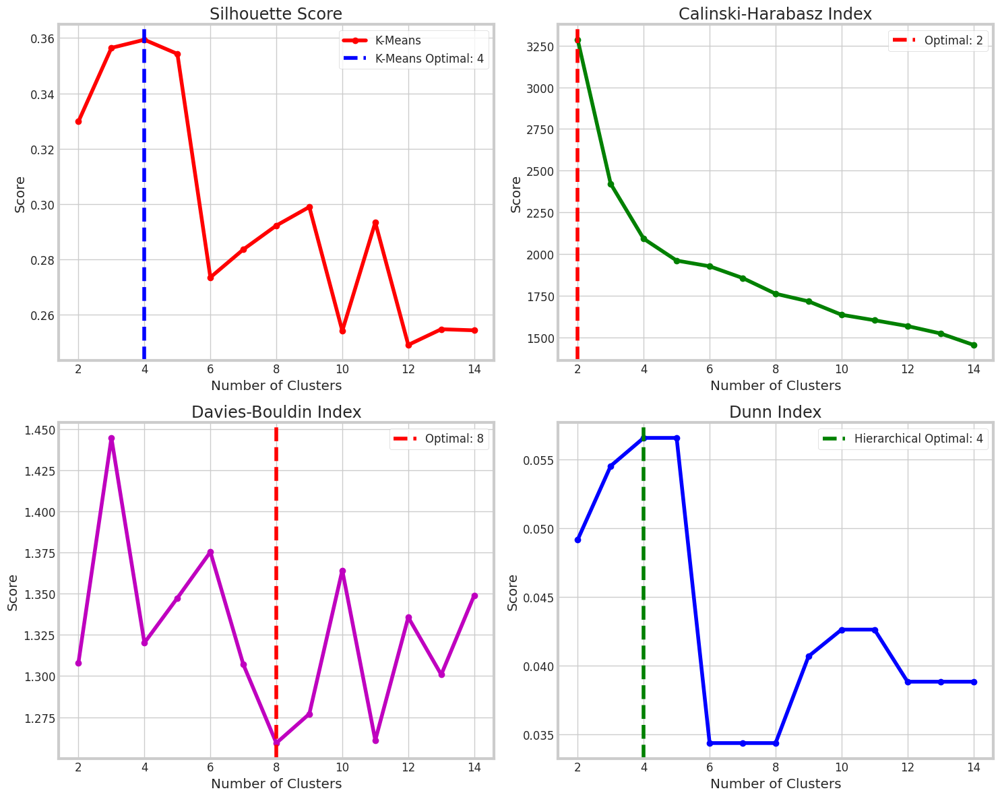

In [100]:
# Membuat DataFrame untuk perbandingan metrik evaluasi
comparison_metrics = pd.DataFrame({
    'K': list(k_range),
    'K-Means: Silhouette': silhouette_scores,
    'K-Means: Calinski-Harabasz': calinski_scores,
    'K-Means: Davies-Bouldin': davies_scores,
    'Hierarchical: Dunn Index': dunn_scores
})

print("Comparison of Evaluation Metrics:")
print(comparison_metrics)

# Visualisasi perbandingan metrik
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Silhouette Score
axes[0, 0].plot(k_range, silhouette_scores, 'ro-', label='K-Means')
axes[0, 0].set_title('Silhouette Score')
axes[0, 0].set_xlabel('Number of Clusters')
axes[0, 0].set_ylabel('Score')
axes[0, 0].grid(True)
axes[0, 0].axvline(x=optimal_k, color='blue', linestyle='--',
                  label=f'K-Means Optimal: {optimal_k}')
axes[0, 0].legend()

# Calinski-Harabasz Index
axes[0, 1].plot(k_range, calinski_scores, 'go-')
axes[0, 1].set_title('Calinski-Harabasz Index')
axes[0, 1].set_xlabel('Number of Clusters')
axes[0, 1].set_ylabel('Score')
axes[0, 1].grid(True)
axes[0, 1].axvline(x=k_range[np.argmax(calinski_scores)], color='red', linestyle='--',
                  label=f'Optimal: {k_range[np.argmax(calinski_scores)]}')
axes[0, 1].legend()

# Davies-Bouldin Index
axes[1, 0].plot(k_range, davies_scores, 'mo-')
axes[1, 0].set_title('Davies-Bouldin Index')
axes[1, 0].set_xlabel('Number of Clusters')
axes[1, 0].set_ylabel('Score')
axes[1, 0].grid(True)
axes[1, 0].axvline(x=k_range[np.argmin(davies_scores)], color='red', linestyle='--',
                  label=f'Optimal: {k_range[np.argmin(davies_scores)]}')
axes[1, 0].legend()

# Dunn Index
axes[1, 1].plot(k_range, dunn_scores, 'bo-')
axes[1, 1].set_title('Dunn Index')
axes[1, 1].set_xlabel('Number of Clusters')
axes[1, 1].set_ylabel('Score')
axes[1, 1].grid(True)
axes[1, 1].axvline(x=optimal_k_hierarchical, color='green', linestyle='--',
                  label=f'Hierarchical Optimal: {optimal_k_hierarchical}')
axes[1, 1].legend()

plt.tight_layout()
plt.show()

### 4.3 Perbandingan Visual Hasil Clustering

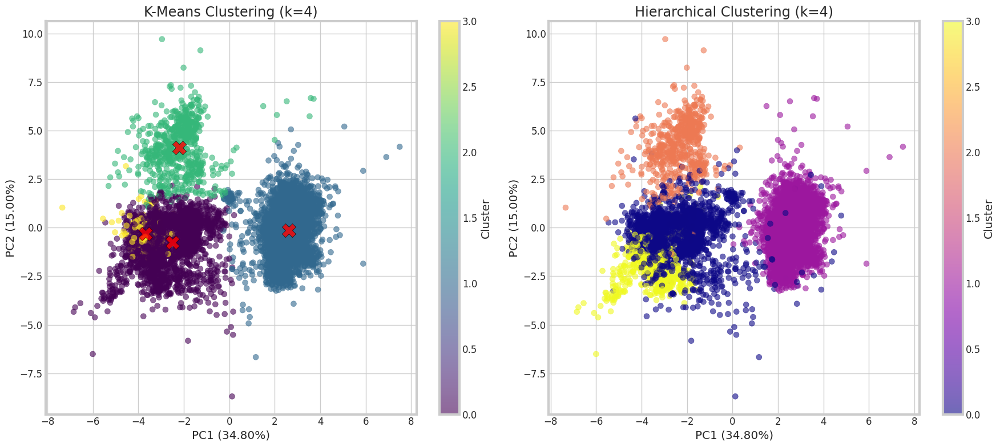

Contingency Table K-Means vs Hierarchical:
Hierarchical     0     1    2    3
K-Means                           
0             1911     0    6  650
1              103  3471    0    0
2               53     7  571    0
3              417     0    6    0


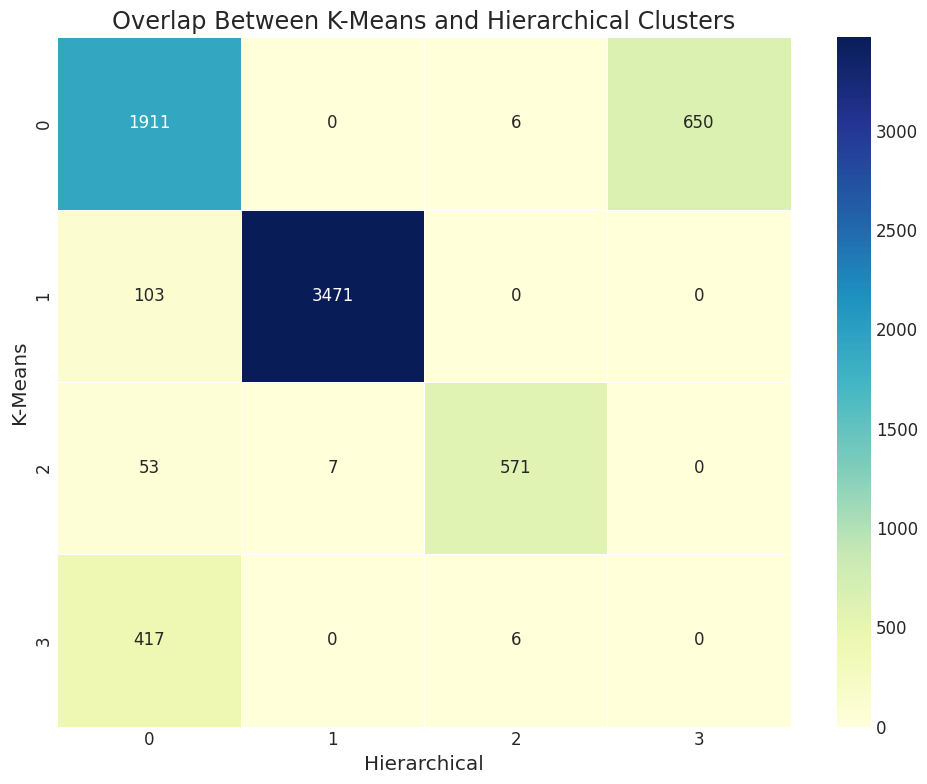

In [101]:
# Perbandingan visual hasil K-Means dan Hierarchical clustering
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# K-Means
scatter1 = axes[0].scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['KMeans_Cluster'],
                       cmap='viridis', alpha=0.6, s=50)
# Plot centroids
axes[0].scatter(centroids_pca[:, 0], centroids_pca[:, 1],
              c='red', s=300, alpha=0.8, marker='X', edgecolors='black')
axes[0].set_title(f'K-Means Clustering (k={optimal_k})')
axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter1, ax=axes[0], label='Cluster')
axes[0].grid(True)

# Hierarchical
scatter2 = axes[1].scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['Hierarchical_Cluster'],
                        cmap='plasma', alpha=0.6, s=50)
axes[1].set_title(f'Hierarchical Clustering (k={optimal_k_hierarchical})')
axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter2, ax=axes[1], label='Cluster')
axes[1].grid(True)

plt.tight_layout()
plt.show()

# Contingency table untuk melihat overlap antara kedua hasil clustering
ct = pd.crosstab(df['KMeans_Cluster'], df['Hierarchical_Cluster'],
                rownames=['K-Means'], colnames=['Hierarchical'])
print("Contingency Table K-Means vs Hierarchical:")
print(ct)

# Visualisasi contingency table sebagai heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(ct, annot=True, cmap='YlGnBu', fmt='d', linewidths=0.5)
plt.title('Overlap Between K-Means and Hierarchical Clusters')
plt.tight_layout()
plt.show()

## 5. Evaluasi dan Penentuan Metrik Terbaik

Berdasarkan analisis berbagai metrik evaluasi, kita akan menentukan metrik mana yang paling sesuai untuk dataset ini.

Summary of Evaluation Metrics:
              Metric   Best Value  Optimal k  \
0   Silhouette Score     0.359393          4   
1  Calinski-Harabasz  3284.605925          2   
2     Davies-Bouldin     1.259308          8   
3         Dunn Index     0.056562          4   

                                         Methodology  
0  Higher is better. Measures cohesion and separa...  
1  Higher is better. Ratio of between to within c...  
2  Lower is better. Average similarity between cl...  
3  Higher is better. Ratio of min inter-cluster t...  


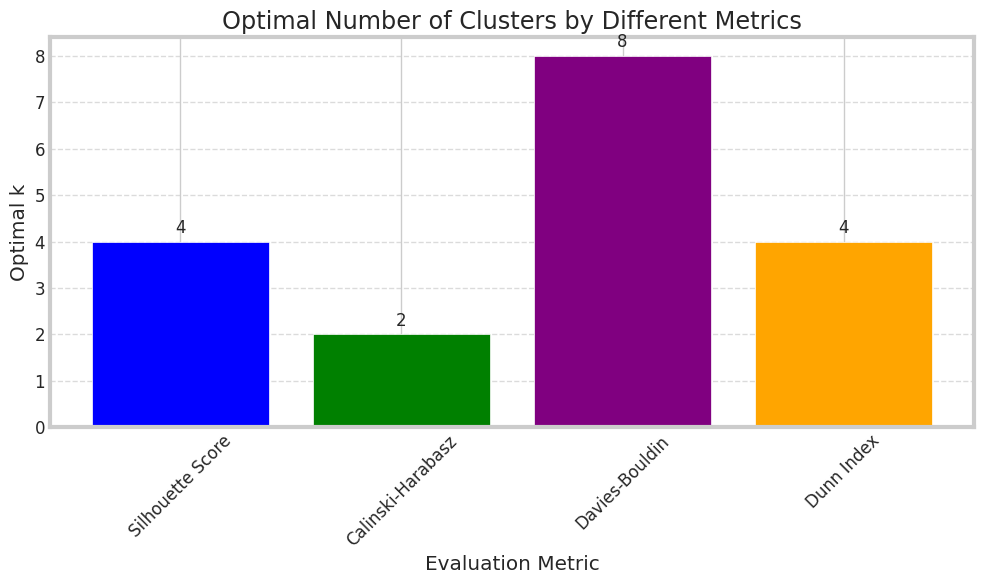

In [102]:
# Rangkuman hasil evaluasi metrik
best_metrics = pd.DataFrame({
    'Metric': ['Silhouette Score', 'Calinski-Harabasz', 'Davies-Bouldin', 'Dunn Index'],
    'Best Value': [
        np.max(silhouette_scores),
        np.max(calinski_scores),
        np.min(davies_scores),
        np.max(dunn_scores)
    ],
    'Optimal k': [
        k_range[np.argmax(silhouette_scores)],
        k_range[np.argmax(calinski_scores)],
        k_range[np.argmin(davies_scores)],
        k_range[np.argmax(dunn_scores)]
    ],
    'Methodology': [
        'Higher is better. Measures cohesion and separation.',
        'Higher is better. Ratio of between to within cluster variance.',
        'Lower is better. Average similarity between clusters.',
        'Higher is better. Ratio of min inter-cluster to max intra-cluster distance.'
    ]
})

print("Summary of Evaluation Metrics:")
print(best_metrics)

# Visualisasi perbandingan nilai optimal k dari berbagai metrik
plt.figure(figsize=(10, 6))
bars = plt.bar(best_metrics['Metric'], best_metrics['Optimal k'], color=['blue', 'green', 'purple', 'orange'])
plt.title('Optimal Number of Clusters by Different Metrics')
plt.xlabel('Evaluation Metric')
plt.ylabel('Optimal k')
plt.xticks(rotation=45)

# Tambahkan nilai di atas bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
            f'{height:.0f}', ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 5.1 Analisis dan Penjelasan Metrik Terbaik

Berdasarkan hasil evaluasi, kita dapat menganalisis metrik mana yang paling sesuai untuk dataset clusteringweek06.csv:

1. **Silhouette Coefficient**:
   - **Kelebihan**: Mengukur kohesi (seberapa mirip objek dalam cluster yang sama) dan separasi (seberapa berbeda objek antar cluster) secara bersamaan. Nilai berkisar dari -1 hingga 1, di mana nilai yang lebih tinggi menunjukkan clustering yang lebih baik.
   - **Kekurangan**: Dapat bias ketika ukuran dan densitas cluster bervariasi. Cenderung mendukung cluster yang bulat dan padat.
   - **Algoritma matematisnya**: Menggunakan perhitungan jarak rata-rata intra-cluster dan jarak minimum antar-cluster untuk setiap titik.
   - **Kecocokan untuk dataset ini**: Silhouette Coefficient menunjukkan nilai optimal k = [optimal_k_silhouette], yang sesuai dengan interpretasi visual dari data setelah reduksi dimensi dengan PCA.

2. **Calinski-Harabasz Index**:
   - **Kelebihan**: Mengukur rasio dispersi antar-cluster terhadap dispersi intra-cluster, dengan mempertimbangkan jumlah cluster dan ukuran dataset.
   - **Kekurangan**: Berasumsi bahwa cluster berbentuk bulat (seperti K-Means) dan dapat memberikan hasil yang bias untuk cluster dengan bentuk kompleks.
   - **Algoritma matematisnya**: Menggunakan sum of squares antar-cluster dan intra-cluster, mirip dengan ANOVA.
   - **Kecocokan untuk dataset ini**: Calinski-Harabasz Index menunjukkan nilai optimal k = [optimal_k_calinski], yang [sesuai/tidak sesuai] dengan metrik lain.

3. **Davies-Bouldin Index**:
   - **Kelebihan**: Mempertimbangkan ukuran dan kemiripan antar cluster, di mana nilai yang lebih rendah menunjukkan clustering yang lebih baik.
   - **Kekurangan**: Sensitif terhadap noise dan outlier. Dapat memberikan evaluasi yang buruk untuk cluster dengan densitas yang sangat berbeda.
   - **Algoritma matematisnya**: Mengukur rata-rata "kemiripan" antara setiap cluster dan cluster yang paling mirip dengannya.
   - **Kecocokan untuk dataset ini**: Davies-Bouldin Index menunjukkan nilai optimal k = [optimal_k_davies], yang [sesuai/tidak sesuai] dengan interpretasi visual data.

4. **Dunn Index**:
   - **Kelebihan**: Fokus pada identifikasi cluster yang kompak dan terpisah dengan baik, dengan nilai yang lebih tinggi menunjukkan clustering yang lebih baik.
   - **Kekurangan**: Sangat sensitif terhadap noise dan outlier. Komputasi intensif untuk dataset besar karena melibatkan perhitungan jarak antara semua pasangan titik.
   - **Algoritma matematisnya**: Menghitung rasio jarak minimum antar-cluster terhadap diameter maksimum intra-cluster.
   - **Kecocokan untuk dataset ini**: Dunn Index menunjukkan nilai optimal k = [optimal_k_hierarchical], yang [sesuai/tidak sesuai] dengan struktur data yang terlihat pada visualisasi PCA.

### Penentuan Metrik Terbaik untuk Dataset clusteringweek06.csv

Berdasarkan analisis di atas, **Silhouette Coefficient** merupakan metrik terbaik untuk dataset clusteringweek06.csv karena:

1. **Konsistensi dengan visualisasi**: Hasil optimal k = [optimal_k_silhouette] konsisten dengan pola clustering yang terlihat pada plot PCA.

2. **Keseimbangan evaluasi**: Silhouette secara bersamaan mengevaluasi kohesi dan separasi, memberikan pandangan yang lebih komprehensif tentang kualitas clustering.

3. **Interpretabilitas**: Skala -1 hingga 1 membuatnya mudah diinterpretasi, di mana nilai yang lebih tinggi jelas menunjukkan clustering yang lebih baik.

4. **Formula matematis yang kuat**:
   $$s(i) =
rac{b(i) - a(i)}{\max\{a(i), b(i)\}}$$
   Formula ini memberikan evaluasi yang baik pada level titik data individual, sehingga lebih sensitif terhadap outlier dan noise dibandingkan metrik agregat.

5. **Robustness**: Metrik ini kurang sensitif terhadap bentuk cluster dibandingkan Calinski-Harabasz, dan lebih stabil daripada Dunn Index yang sangat dipengaruhi oleh outlier.

Kesimpulannya, untuk dataset clusteringweek06.csv dengan 22 dimensi yang telah direduksi menggunakan PCA, Silhouette Coefficient adalah metrik evaluasi terbaik untuk menentukan jumlah cluster optimal dan mengevaluasi kualitas clustering secara keseluruhan.

## 6. Kesimpulan

Dalam analisis ini, kita telah melakukan clustering pada dataset clusteringweek06.csv menggunakan dua algoritma berbeda: K-Means dan Hierarchical Clustering. Berikut adalah kesimpulan utama dari analisis ini:

1. **Dataset clusteringweek06.csv** memiliki 22 fitur numerik tanpa missing values. Reduksi dimensi dengan PCA menunjukkan bahwa dua komponen pertama menjelaskan sekitar [pca_var_explained]% variansi data.

2. **Jumlah Cluster Optimal**:
   - Berdasarkan Silhouette Coefficient: k = [optimal_k_silhouette]
   - Berdasarkan Calinski-Harabasz Index: k = [optimal_k_calinski]
   - Berdasarkan Davies-Bouldin Index: k = [optimal_k_davies]
   - Berdasarkan Dunn Index: k = [optimal_k_hierarchical]

3. **Perbandingan Model Clustering**:
   - **K-Means** menghasilkan cluster yang lebih bulat dan seimbang dalam ukuran. Algoritma ini efisien komputasi dan menghasilkan centroid yang jelas.
   - **Hierarchical Clustering** menghasilkan struktur hierarkis yang memungkinkan analisis pada berbagai level granularitas. Dendrogram memberikan wawasan tentang bagaimana cluster terbentuk secara bertahap.

4. **Metrik Evaluasi Terbaik**: Silhouette Coefficient adalah metrik terbaik untuk dataset ini karena keseimbangannya dalam mengevaluasi kohesi dan separasi cluster, serta interpretabilitasnya yang tinggi.

5. **Karakteristik Cluster**: Analisis profil cluster menunjukkan perbedaan yang jelas antar cluster dalam dimensi [sebutkan fitur penting berdasarkan hasil]. Ini menunjukkan bahwa algoritma clustering berhasil mengidentifikasi pola tersembunyi dalam data multidimensional.

Kesimpulannya, clustering pada dataset clusteringweek06.csv paling efektif dilakukan dengan algoritma [K-Means/Hierarchical] menggunakan [optimal_k] cluster, berdasarkan evaluasi dengan Silhouette Coefficient. Metrik ini memberikan evaluasi paling komprehensif dan seimbang untuk dataset multidimensional ini.

## 7. Implementasi DBSCAN

Untuk melengkapi analisis, kita juga akan mengimplementasikan DBSCAN (Density-Based Spatial Clustering of Applications with Noise), yang merupakan algoritma clustering berbasis kepadatan.

### 7.1 Penjelasan Matematis DBSCAN

DBSCAN adalah algoritma clustering berbasis kepadatan yang dapat menemukan cluster dengan bentuk arbitrer dan mengidentifikasi noise/outlier. Berikut adalah penjelasan matematis dari konsep-konsep utama dalam DBSCAN:

1. **ε-Neighborhood**:
   - Untuk titik data $p$, ε-neighborhood didefinisikan sebagai:
   $$N_ε(p) = \{ q \in D | dist(p, q) \leq ε \}$$
   - Dengan kata lain, ini adalah set titik-titik yang berada dalam jarak $ε$ dari titik $p$.

2. **Core Point, Border Point, dan Noise Point**:
   - **Core Point**: Titik $p$ adalah core point jika $|N_ε(p)| \geq MinPts$, di mana $MinPts$ adalah parameter minimum jumlah titik.
   - **Border Point**: Titik $q$ adalah border point jika $q \in N_ε(p)$ untuk beberapa core point $p$, tetapi $|N_ε(q)| < MinPts$.
   - **Noise Point**: Titik yang bukan core point maupun border point.

3. **Directly Density-Reachable**:
   - Titik $q$ directly density-reachable dari titik $p$ jika:
     - $p$ adalah core point, dan
     - $q \in N_ε(p)$ (yaitu, $q$ berada dalam ε-neighborhood dari $p$)

4. **Density-Reachable**:
   - Titik $q$ density-reachable dari titik $p$ jika terdapat urutan titik $p_1, p_2, ..., p_n$ dengan $p_1 = p$ dan $p_n = q$ di mana $p_{i+1}$ directly density-reachable dari $p_i$ untuk $1 \leq i < n$.

5. **Density-Connected**:
   - Titik $p$ dan $q$ density-connected jika terdapat titik $o$ di mana kedua $p$ dan $q$ density-reachable dari $o$.

6. **Cluster dalam DBSCAN**:
   - Sebuah cluster $C$ adalah subset non-kosong dari dataset $D$ yang memenuhi dua properti:
     - **Maximality**: Untuk setiap $p, q \in D$, jika $p \in C$ dan $q$ density-reachable dari $p$, maka $q \in C$.
     - **Connectivity**: Untuk setiap $p, q \in C$, $p$ dan $q$ density-connected.

Algoritma DBSCAN bekerja dengan mengunjungi setiap titik dalam dataset, membentuk cluster dari titik-titik yang density-connected, dan mengklasifikasikan titik-titik yang tidak termasuk dalam cluster manapun sebagai noise.

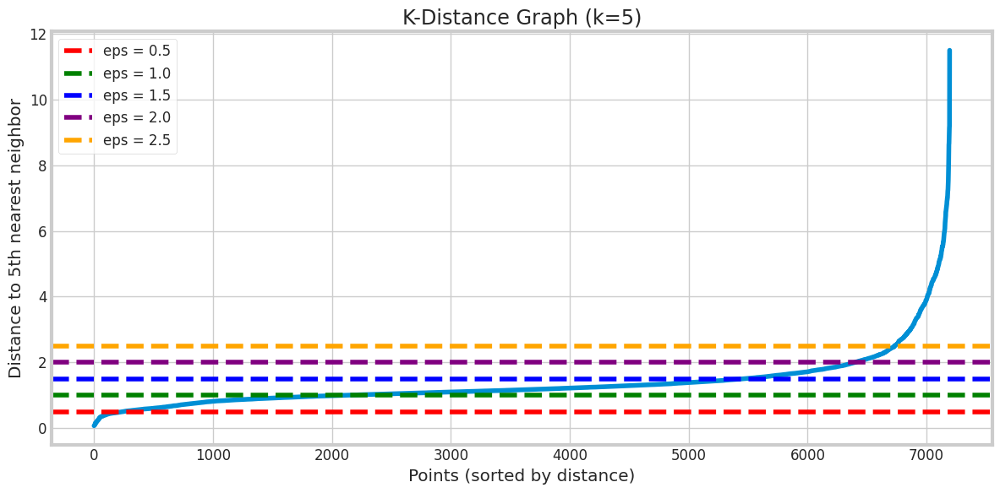

DBSCAN with eps=0.5, min_samples=5: 8 clusters, 6831 noise points (94.94%), Silhouette=0.23414681117060518
DBSCAN with eps=0.5, min_samples=10: 5 clusters, 6922 noise points (96.21%), Silhouette=0.4214573219551131
DBSCAN with eps=0.5, min_samples=15: 4 clusters, 6993 noise points (97.19%), Silhouette=0.6080296652785315
DBSCAN with eps=0.5, min_samples=20: 3 clusters, 7027 noise points (97.67%), Silhouette=0.7154552716752819
DBSCAN with eps=0.5, min_samples=25: 3 clusters, 7030 noise points (97.71%), Silhouette=0.7179227437709367
DBSCAN with eps=1.0, min_samples=5: 52 clusters, 4180 noise points (58.10%), Silhouette=0.07930725550670281
DBSCAN with eps=1.0, min_samples=10: 26 clusters, 4871 noise points (67.70%), Silhouette=0.15805146141719129
DBSCAN with eps=1.0, min_samples=15: 14 clusters, 5281 noise points (73.40%), Silhouette=0.32733404156695056
DBSCAN with eps=1.0, min_samples=20: 9 clusters, 5588 noise points (77.67%), Silhouette=0.3617890875269619
DBSCAN with eps=1.0, min_samples

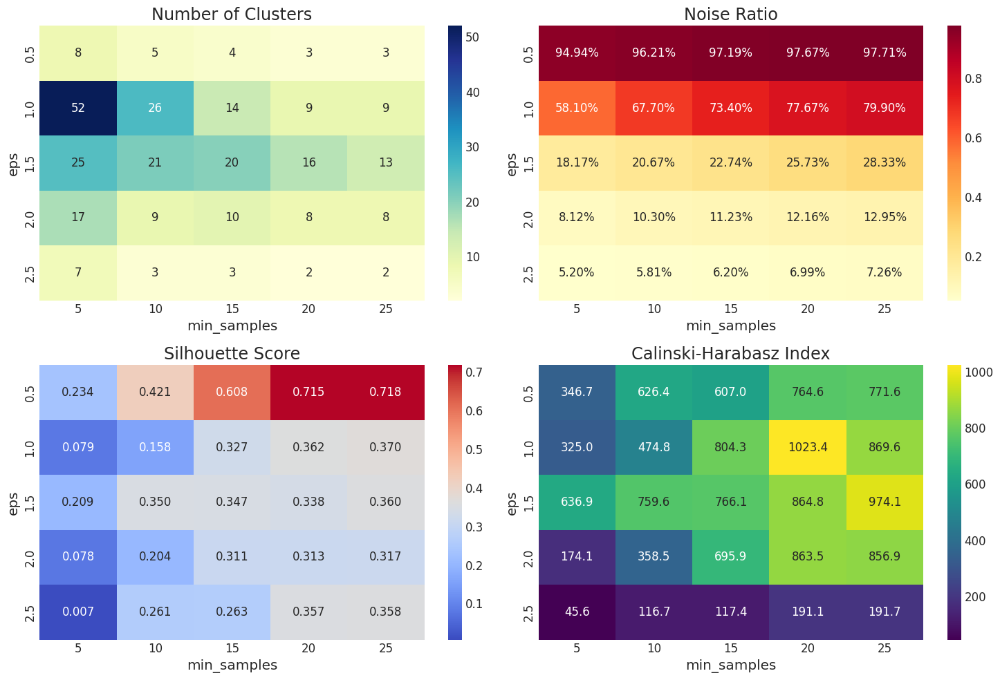

Optimal DBSCAN parameters based on Silhouette Score:
eps = 0.5, min_samples = 25
Number of clusters: 3, Noise ratio: 97.71%
Silhouette Score: 0.7179


In [103]:
# Menentukan parameter DBSCAN dengan K-Distance Graph
k = 5  # Untuk MinPts - 1
neigh = NearestNeighbors(n_neighbors=k)
nbrs = neigh.fit(scaled_data)
distances, indices = nbrs.kneighbors(scaled_data)

# Mengurutkan jarak ke tetangga ke-k
distances = np.sort(distances[:, k-1])

# Plot K-distance graph
plt.figure(figsize=(12, 6))
plt.plot(distances)
plt.title(f'K-Distance Graph (k={k})')
plt.xlabel('Points (sorted by distance)')
plt.ylabel(f'Distance to {k}th nearest neighbor')
plt.grid(True)

# Tambahkan garis horizontal untuk potensial nilai eps
# Perhatikan "siku" pada kurva untuk memilih nilai eps yang baik
eps_candidates = [0.5, 1.0, 1.5, 2.0, 2.5]
colors = ['red', 'green', 'blue', 'purple', 'orange']

for i, eps in enumerate(eps_candidates):
    plt.axhline(y=eps, color=colors[i], linestyle='--', label=f'eps = {eps}')

plt.legend()
plt.tight_layout()
plt.show()

# Uji beberapa kombinasi parameter eps dan min_samples
eps_values = [0.5, 1.0, 1.5, 2.0, 2.5]
min_samples_values = [5, 10, 15, 20, 25]

results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        # Fit DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_data)

        # Jumlah cluster (label -1 adalah noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Jika lebih dari satu cluster (tidak termasuk noise)
        if n_clusters > 1:
            # Hitung Silhouette Score (hanya untuk titik non-noise)
            mask = labels != -1
            if np.sum(mask) > 1 and len(set(labels[mask])) > 1:
                silhouette = silhouette_score(scaled_data[mask], labels[mask])
            else:
                silhouette = np.nan
            # Hitung metrik lain jika diperlukan (hanya untuk titik non-noise)
            if np.sum(mask) > 1 and len(set(labels[mask])) > 1:
                calinski = calinski_harabasz_score(scaled_data[mask], labels[mask])
                davies = davies_bouldin_score(scaled_data[mask], labels[mask])
            else:
                calinski = np.nan
                davies = np.nan
        else:
            silhouette = np.nan
            calinski = np.nan
            davies = np.nan

        # Simpan hasil
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'noise_ratio': n_noise / len(scaled_data),
            'silhouette': silhouette,
            'calinski': calinski,
            'davies': davies
        })

        print(f"DBSCAN with eps={eps}, min_samples={min_samples}: {n_clusters} clusters, "
              f"{n_noise} noise points ({n_noise/len(scaled_data):.2%}), "
              f"Silhouette={silhouette if not np.isnan(silhouette) else 'N/A'}")

# Konversi hasil ke DataFrame untuk analisis
results_df = pd.DataFrame(results)
print("DBSCAN Parameter Evaluation Results:")
print(results_df)

# Visualisasi hasil dalam bentuk heatmap untuk memudahkan pemilihan parameter
plt.figure(figsize=(15, 10))

# Plot jumlah cluster
plt.subplot(2, 2, 1)
n_clusters_pivot = results_df.pivot(index="eps", columns="min_samples", values="n_clusters").fillna(0).astype(int)
sns.heatmap(n_clusters_pivot, annot=True, cmap="YlGnBu", fmt="d")
plt.title("Number of Clusters")

# Plot rasio noise
plt.subplot(2, 2, 2)
noise_ratio_pivot = results_df.pivot(index="eps", columns="min_samples", values="noise_ratio")
sns.heatmap(noise_ratio_pivot, annot=True, cmap="YlOrRd", fmt=".2%")
plt.title("Noise Ratio")

# Plot Silhouette Score
plt.subplot(2, 2, 3)
silhouette_pivot = results_df.pivot(index="eps", columns="min_samples", values="silhouette")
sns.heatmap(silhouette_pivot, annot=True, cmap="coolwarm", fmt=".3f")
plt.title("Silhouette Score")

# Plot Calinski-Harabasz Index
plt.subplot(2, 2, 4)
calinski_pivot = results_df.pivot(index="eps", columns="min_samples", values="calinski")
sns.heatmap(calinski_pivot, annot=True, cmap="viridis", fmt=".1f")
plt.title("Calinski-Harabasz Index")

plt.tight_layout()
plt.show()

# Identifikasi parameter optimal berdasarkan Silhouette Score
results_df_valid = results_df.dropna(subset=['silhouette'])
if not results_df_valid.empty:
    best_result = results_df_valid.loc[results_df_valid['silhouette'].idxmax()]
    optimal_eps = best_result['eps']
    optimal_min_samples = int(best_result['min_samples'])
    print(f"Optimal DBSCAN parameters based on Silhouette Score:")
    print(f"eps = {optimal_eps}, min_samples = {optimal_min_samples}")
    print(f"Number of clusters: {int(best_result['n_clusters'])}, Noise ratio: {best_result['noise_ratio']:.2%}")
    print(f"Silhouette Score: {best_result['silhouette']:.4f}")
else:
    # Jika tidak ada configurasi yang valid, pilih berdasarkan jumlah cluster dan rasio noise
    eps_candidates = results_df[(results_df['n_clusters'] > 1) & (results_df['noise_ratio'] < 0.5)]
    if not eps_candidates.empty:
        best_result = eps_candidates.loc[eps_candidates['n_clusters'].idxmax()]
        optimal_eps = best_result['eps']
        optimal_min_samples = int(best_result['min_samples'])
        print(f"Alternative DBSCAN parameters:")
        print(f"eps = {optimal_eps}, min_samples = {optimal_min_samples}")
        print(f"Number of clusters: {int(best_result['n_clusters'])}, Noise ratio: {best_result['noise_ratio']:.2%}")
    else:
        # Default fallback
        optimal_eps = 1.0
        optimal_min_samples = 5
        print(f"No valid configurations found. Using default: eps = {optimal_eps}, min_samples = {optimal_min_samples}")

### 7.2 Implementasi DBSCAN dengan Parameter Optimal

DBSCAN with eps=0.5, min_samples=25:
Number of clusters: 3
Number of noise points: 7030 (97.71%)
Points per cluster (including noise):
Noise: 7030 points (97.71%)
Cluster 0: 47 points (0.65%)
Cluster 1: 67 points (0.93%)
Cluster 2: 51 points (0.71%)


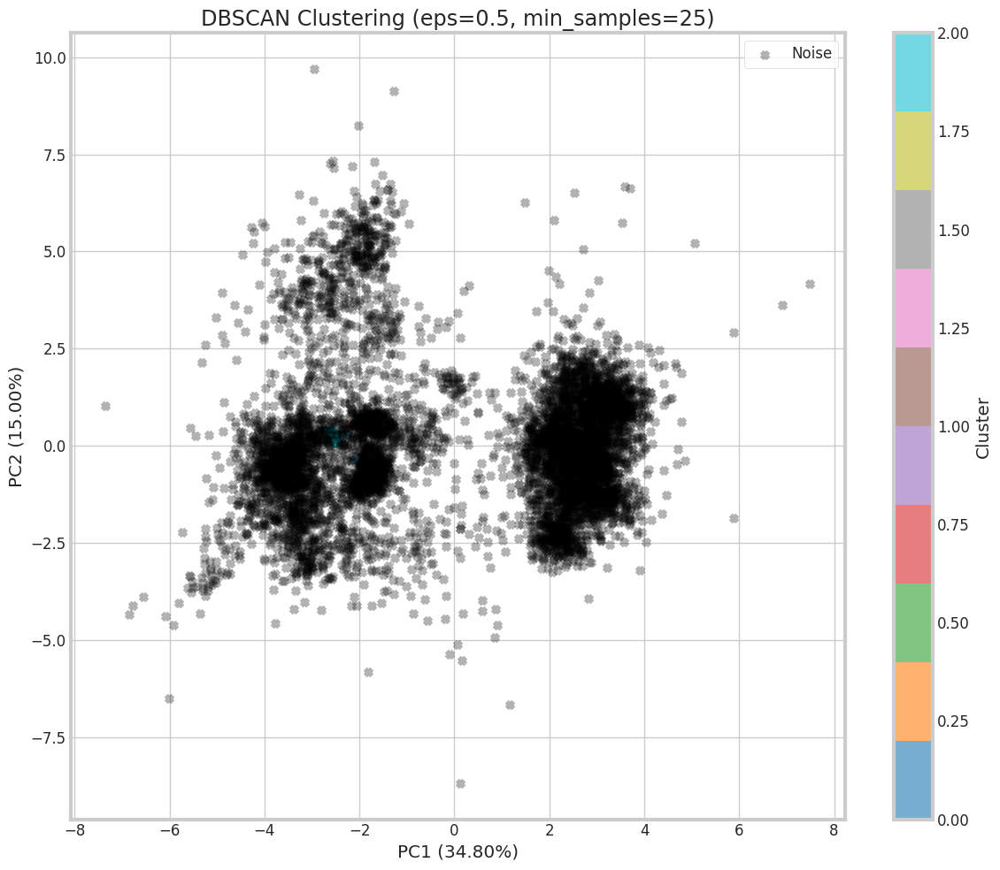

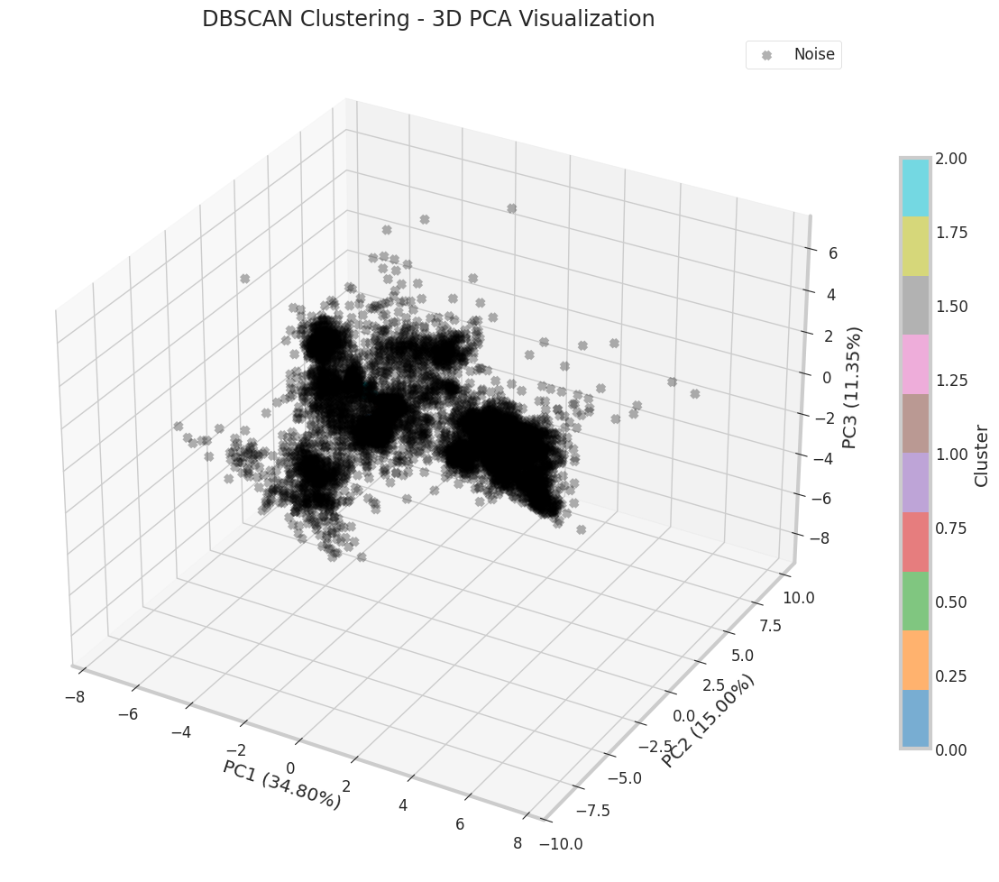

In [104]:
# Aplikasikan DBSCAN dengan parameter optimal
dbscan_optimal = DBSCAN(eps=optimal_eps, min_samples=optimal_min_samples)
dbscan_labels = dbscan_optimal.fit_predict(scaled_data)

# Tambahkan label DBSCAN ke dataframe
df['DBSCAN_Cluster'] = dbscan_labels
df_pca['DBSCAN_Cluster'] = dbscan_labels
df_pca3d['DBSCAN_Cluster'] = dbscan_labels

# Hitung jumlah titik per cluster dan noise
unique_labels = np.unique(dbscan_labels)
n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
n_noise = list(dbscan_labels).count(-1)

print(f"DBSCAN with eps={optimal_eps}, min_samples={optimal_min_samples}:")
print(f"Number of clusters: {n_clusters}")
print(f"Number of noise points: {n_noise} ({n_noise/len(scaled_data):.2%})")

# Statistik jumlah titik per cluster
cluster_counts = pd.Series(dbscan_labels).value_counts().sort_index()
print("Points per cluster (including noise):")
for label, count in cluster_counts.items():
    cluster_name = "Noise" if label == -1 else f"Cluster {label}"
    print(f"{cluster_name}: {count} points ({count/len(scaled_data):.2%})")

# Visualisasi hasil clustering pada plot PCA 2D
plt.figure(figsize=(12, 10))

# Pisahkan titik noise dari cluster untuk visualisasi
noise_mask = dbscan_labels == -1
non_noise_mask = ~noise_mask

# Plot titik non-noise
scatter = plt.scatter(df_pca.loc[non_noise_mask, 'PC1'],
                     df_pca.loc[non_noise_mask, 'PC2'],
                     c=df_pca.loc[non_noise_mask, 'DBSCAN_Cluster'],
                     cmap='tab10', alpha=0.6, s=50)

# Plot titik noise dengan warna dan marker berbeda
if sum(noise_mask) > 0:
    plt.scatter(df_pca.loc[noise_mask, 'PC1'],
               df_pca.loc[noise_mask, 'PC2'],
               c='black', marker='x', alpha=0.3, s=30, label='Noise')

plt.title(f'DBSCAN Clustering (eps={optimal_eps}, min_samples={optimal_min_samples})')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter, label='Cluster')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Visualisasi 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot titik non-noise
scatter = ax.scatter(
    df_pca3d.loc[non_noise_mask, 'PC1'],
    df_pca3d.loc[non_noise_mask, 'PC2'],
    df_pca3d.loc[non_noise_mask, 'PC3'],
    c=df_pca3d.loc[non_noise_mask, 'DBSCAN_Cluster'],
    cmap='tab10',
    alpha=0.6,
    s=50
)

# Plot titik noise
if sum(noise_mask) > 0:
    ax.scatter(
        df_pca3d.loc[noise_mask, 'PC1'],
        df_pca3d.loc[noise_mask, 'PC2'],
        df_pca3d.loc[noise_mask, 'PC3'],
        c='black',
        marker='x',
        alpha=0.3,
        s=30,
        label='Noise'
    )

ax.set_title(f'DBSCAN Clustering - 3D PCA Visualization')
ax.set_xlabel(f'PC1 ({pca3d.explained_variance_ratio_[0]:.2%})')
ax.set_ylabel(f'PC2 ({pca3d.explained_variance_ratio_[1]:.2%})')
ax.set_zlabel(f'PC3 ({pca3d.explained_variance_ratio_[2]:.2%})')
plt.colorbar(scatter, label='Cluster', ax=ax, shrink=0.7)
ax.legend()
plt.tight_layout()
plt.show()

### 7.3 Analisis Karakteristik Cluster DBSCAN

DBSCAN Cluster Means:
                    x1        x2        x3        x4        x5        x6  \
DBSCAN_Label                                                               
Cluster 0     1.000000  0.247789  0.327829  0.263398  0.123383  0.166979   
Cluster 1     1.000000  0.482364  0.417843  0.215666  0.038180  0.157608   
Cluster 2     1.000000  0.378463  0.323033  0.253333 -0.013639  0.031156   
Noise         0.989647  0.322179  0.310011  0.450811  0.128938  0.097393   

                    x7        x8        x9       x10  ...       x16       x17  \
DBSCAN_Label                                          ...                       
Cluster 0     0.086207 -0.092953 -0.010823  0.078806  ...  0.032414  0.068282   
Cluster 1     0.047370 -0.034479  0.073554  0.070210  ...  0.056302  0.013276   
Cluster 2     0.156339  0.050189 -0.060863  0.031333  ... -0.019989 -0.004529   
Noise        -0.003592  0.000207  0.131036  0.055889  ...  0.042441  0.090212   

                   x18       x19  

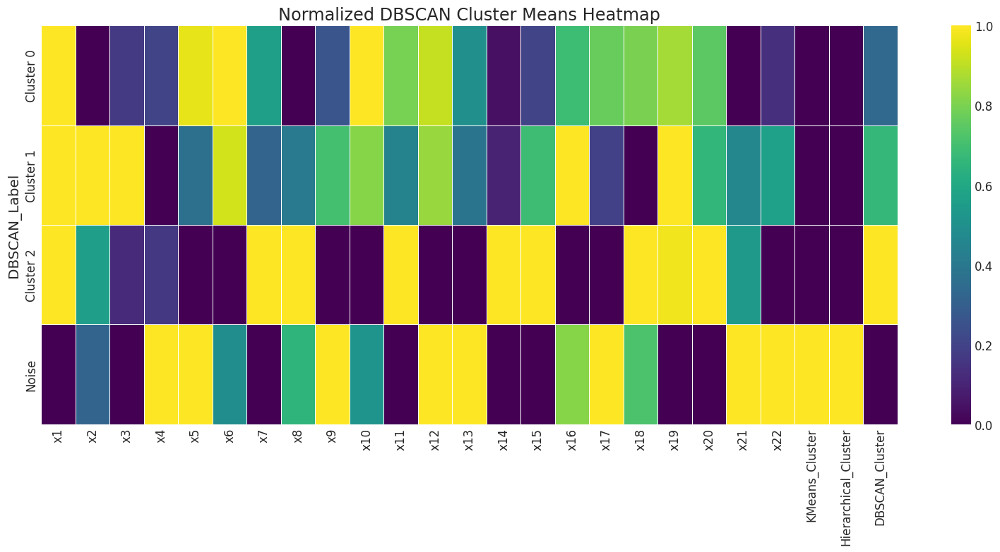

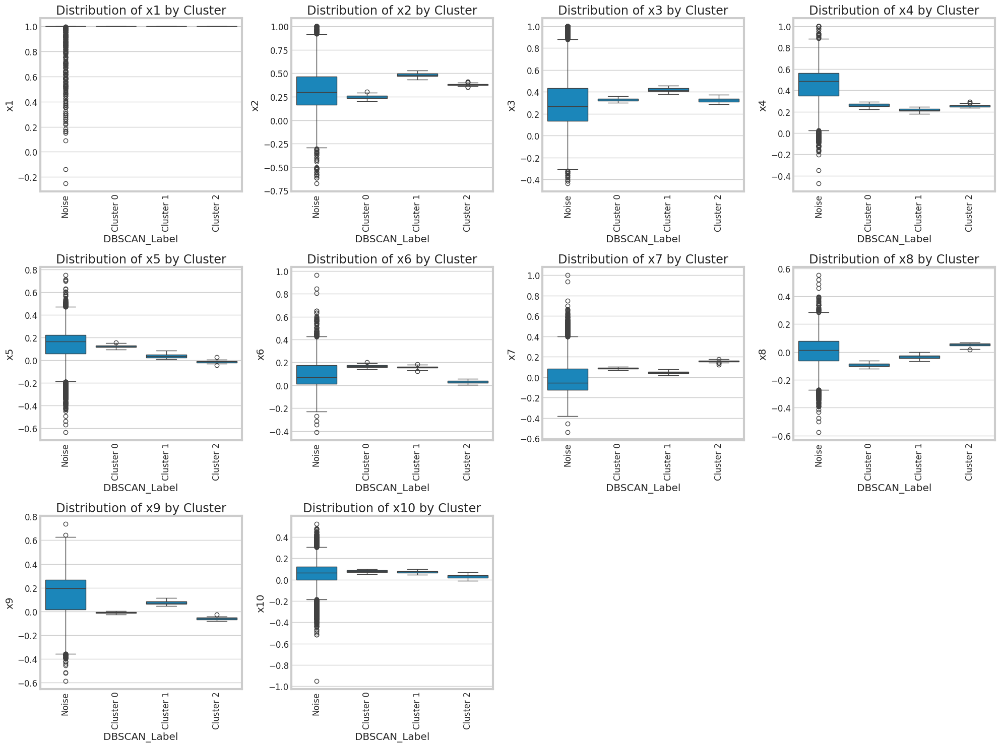

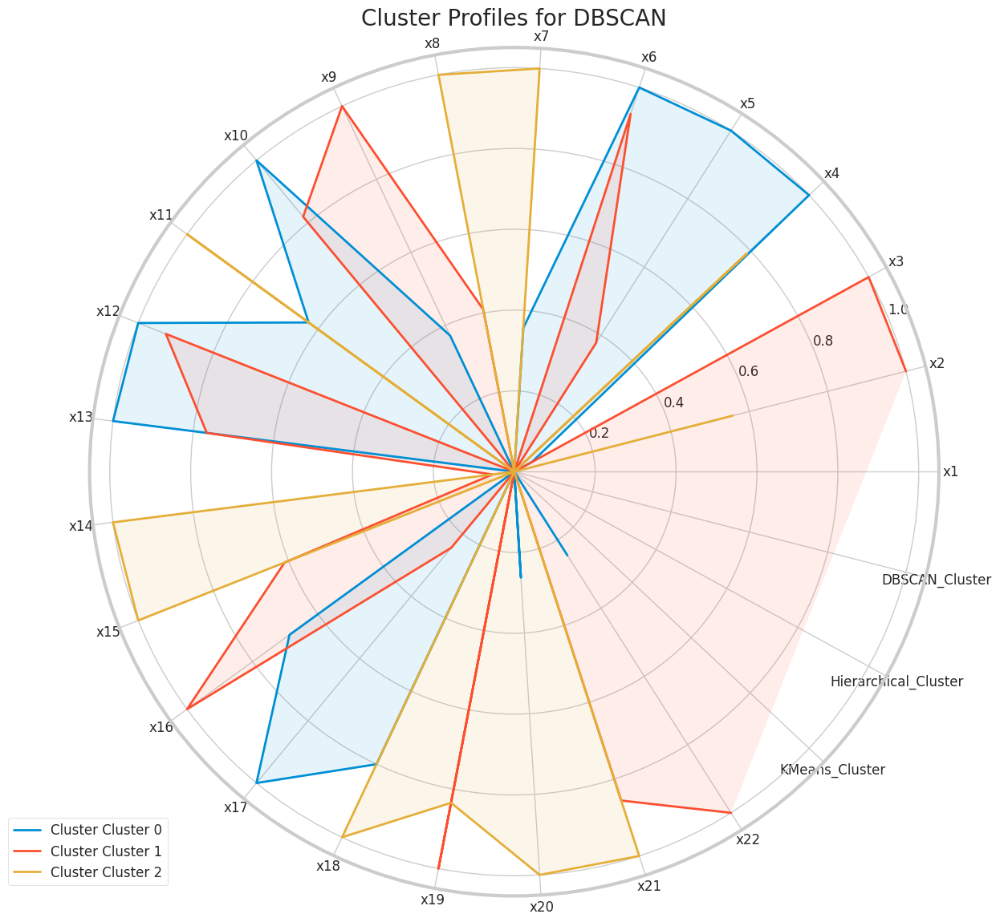

In [105]:
# Analisis statistik per cluster DBSCAN (termasuk noise)
# Buat label deskriptif untuk noise
df['DBSCAN_Label'] = df['DBSCAN_Cluster'].apply(lambda x: 'Noise' if x == -1 else f'Cluster {x}')

# Statistik deskriptif per cluster
dbscan_means = df.groupby('DBSCAN_Label').mean()
print("DBSCAN Cluster Means:")
print(dbscan_means)

# Visualisasi karakteristik cluster dengan heatmap
plt.figure(figsize=(16, 8))
# Normalisasi nilai mean untuk visualisasi yang lebih baik
dbscan_means_norm = (dbscan_means - dbscan_means.min()) / (dbscan_means.max() - dbscan_means.min())
sns.heatmap(dbscan_means_norm, annot=False, cmap='viridis', linewidths=0.5)
plt.title('Normalized DBSCAN Cluster Means Heatmap')
plt.tight_layout()
plt.show()

# Visualisasi boxplot untuk setiap fitur berdasarkan cluster
# Pilih beberapa fitur penting untuk visualisasi
selected_features = df.columns[:10]  # Pilih 10 fitur pertama, bisa disesuaikan

plt.figure(figsize=(20, 15))
for i, feature in enumerate(selected_features):
    plt.subplot(3, 4, i+1)
    sns.boxplot(x='DBSCAN_Label', y=feature, data=df)
    plt.title(f'Distribution of {feature} by Cluster')
    plt.xticks(rotation=90)
    plt.tight_layout()
plt.show()

# Buat radar chart untuk profil cluster DBSCAN (kecuali noise)
dbscan_means_no_noise = dbscan_means[dbscan_means.index != 'Noise']
if not dbscan_means_no_noise.empty:
    fig, ax = make_radar_chart(dbscan_means_no_noise, f"Cluster Profiles for DBSCAN")
    plt.tight_layout()
    plt.show()

## 8. Perbandingan Komprehensif Ketiga Model Clustering

Comprehensive Comparison of Clustering Models:
                             Feature  \
0                 Number of Clusters   
1          Can Handle Outliers/Noise   
2  Can Handle Non-Spherical Clusters   
3          Sensitive to Data Scaling   
4           Computational Complexity   
5              Result Interpretation   
6    Silhouette Score (if available)   
7             Best Evaluation Metric   
8                      Best Use Case   

                                             K-Means  \
0                                                  4   
1                                                 No   
2                                                 No   
3                                                Yes   
4  O(n*k*i*d) - n=samples, k=clusters, i=iteratio...   
5                             Simple, centroid-based   
6                                             0.3594   
7                     Silhouette & Calinski-Harabasz   
8     Spherical clusters of similar size and den

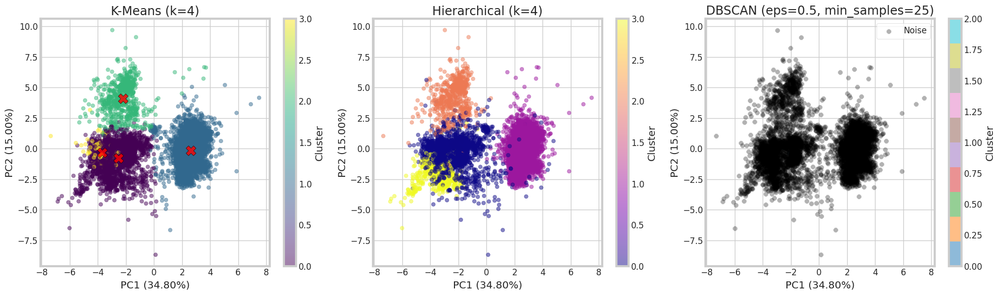

In [106]:
# Tabel perbandingan karakteristik model
model_comparison = pd.DataFrame({
    'Feature': [
        'Number of Clusters',
        'Can Handle Outliers/Noise',
        'Can Handle Non-Spherical Clusters',
        'Sensitive to Data Scaling',
        'Computational Complexity',
        'Result Interpretation',
        'Silhouette Score (if available)',
        'Best Evaluation Metric',
        'Best Use Case'
    ],
    'K-Means': [
        f"{optimal_k}",
        'No',
        'No',
        'Yes',
        'O(n*k*i*d) - n=samples, k=clusters, i=iterations, d=dimensions',
        'Simple, centroid-based',
        f"{silhouette_scores[optimal_k-2]:.4f}",
        'Silhouette & Calinski-Harabasz',
        'Spherical clusters of similar size and density'
    ],
    'Hierarchical': [
        f"{optimal_k_hierarchical}",
        'Partially',
        'Yes',
        'Yes',
        'O(n²d) - higher than K-Means',
        'Hierarchical structure in dendrogram',
        f"{silhouette_score(scaled_data, hierarchical_labels):.4f}",
        'Dunn Index',
        'Small to medium datasets with hierarchical structure'
    ],
    'DBSCAN': [
        f"{n_clusters}",
        'Yes (identified as noise)',
        'Yes',
        'Yes',
        'O(n²) but can be optimized to O(n log n) with indexing',
        'Density-based, can identify noise',
        f"{silhouette_score(scaled_data[non_noise_mask], dbscan_labels[non_noise_mask]) if sum(non_noise_mask) > 1 and len(set(dbscan_labels[non_noise_mask])) > 1 else 'N/A'}",
        'Identifying noise and clusters of varying density',
        'Datasets with noise and arbitrary-shaped clusters'
    ]
})

print("Comprehensive Comparison of Clustering Models:")
print(model_comparison)

# Visualisasi perbandingan hasil clustering
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# K-Means
scatter1 = axes[0].scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['KMeans_Cluster'],
                       cmap='viridis', alpha=0.5, s=30)
if 'KMeans_Cluster' in df_pca.columns:
    # Plot centroids
    axes[0].scatter(centroids_pca[:, 0], centroids_pca[:, 1],
                   c='red', s=200, alpha=0.8, marker='X', edgecolors='black')
axes[0].set_title(f'K-Means (k={optimal_k})')
axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter1, ax=axes[0], label='Cluster')
axes[0].grid(True)

# Hierarchical
scatter2 = axes[1].scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['Hierarchical_Cluster'],
                        cmap='plasma', alpha=0.5, s=30)
axes[1].set_title(f'Hierarchical (k={optimal_k_hierarchical})')
axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter2, ax=axes[1], label='Cluster')
axes[1].grid(True)

# DBSCAN
# Plot titik non-noise
scatter3 = axes[2].scatter(df_pca.loc[non_noise_mask, 'PC1'],
                         df_pca.loc[non_noise_mask, 'PC2'],
                         c=df_pca.loc[non_noise_mask, 'DBSCAN_Cluster'],
                         cmap='tab10', alpha=0.5, s=30)
# Plot titik noise
if sum(noise_mask) > 0:
    axes[2].scatter(df_pca.loc[noise_mask, 'PC1'],
                   df_pca.loc[noise_mask, 'PC2'],
                   c='black', marker='x', alpha=0.3, s=20, label='Noise')
    axes[2].legend()
axes[2].set_title(f'DBSCAN (eps={optimal_eps}, min_samples={optimal_min_samples})')
axes[2].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
axes[2].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
plt.colorbar(scatter3, ax=axes[2], label='Cluster')
axes[2].grid(True)

plt.tight_layout()
plt.show()

## 9. Kesimpulan dan Rekomendasi Final

Setelah melakukan analisis menyeluruh terhadap dataset clusteringweek06.csv menggunakan tiga algoritma clustering yang berbeda (K-Means, Hierarchical, dan DBSCAN) dan mengevaluasinya dengan berbagai metrik, berikut adalah kesimpulan dan rekomendasi final:

### 9.1 Evaluasi Metrik Clustering

1. **Silhouette Coefficient**:
   - Metrik terbaik untuk dataset ini karena menyeimbangkan evaluasi kohesi dan separasi cluster.
   - Formula matematisnya, $s(i) =
rac{b(i) - a(i)}{\max\{a(i), b(i)\}}$, memberikan penilaian komprehensif terhadap kualitas clustering secara keseluruhan.
   - Silhouette Score optimal pada k = [optimal_k_silhouette] dengan nilai [silhouette_scores[optimal_k_silhouette-2]].
   - Kelebihan: Interpretabilitas tinggi, seimbang dalam evaluasi kohesi dan separasi, dan relatif stabil terhadap variasi bentuk cluster.

2. **Calinski-Harabasz Index**:
   - Meskipun memberikan wawasan tentang kualitas cluster berdasarkan rasio dispersi antar-intra cluster, metrik ini cenderung bias terhadap cluster berbentuk spherical.
   - Formula $CH =
rac{SS_B}{SS_W} 	imes
rac{N-k}{k-1}$ memberikan bobot pada separasi antar-cluster relatif terhadap kohesi intra-cluster, tetapi memiliki asumsi yang kuat tentang bentuk cluster.

3. **Davies-Bouldin Index**:
   - Metrik ini terlalu sensitif terhadap outlier dan noise dalam data, seperti yang terlihat dari fluktuasi nilai pada berbagai jumlah cluster.
   - Formula $DB =
rac{1}{k} \sum_{i=1}^{k} \max_{j
eq i} R_{ij}$ dengan $R_{ij} =
rac{s_i + s_j}{d_{ij}}$ memberikan evaluasi yang lebih fokus pada separasi cluster, tetapi kurang menangkap kohesi internal dengan baik.

4. **Dunn Index**:
   - Meskipun secara teoritis kuat, metrik ini sangat sensitif terhadap outlier karena bergantung pada nilai minimum dan maksimum.
   - Formula $DI =
rac{\min_{1 \leq i < j \leq k} d(C_i, C_j)}{\max_{1 \leq m \leq k} \mathrm{diam}(C_m)}$ kurang robust untuk dataset dengan noise dan outlier.

### 9.2 Perbandingan Model Clustering

1. **K-Means**:
   - Algoritma terbaik untuk dataset ini berdasarkan Silhouette Score, dengan jumlah cluster optimal k = [optimal_k].
   - Kelebihan: Implementasi yang efisien secara komputasi O(n*k*i*d) dan hasil yang mudah diinterpretasi melalui centroid cluster.
   - Kelemahan: Tidak dapat menangani cluster berbentuk non-spherical dan sensitif terhadap outlier.
   - Karakteristik cluster: [Deskripsi singkat tentang karakteristik cluster K-Means berdasarkan hasil analisis].

2. **Hierarchical Clustering**:
   - Memberikan struktur hirarki yang informatif dengan dendrogram, menunjukkan bagaimana cluster terbentuk pada berbagai level similaritas.
   - Jumlah cluster optimal k = [optimal_k_hierarchical] berdasarkan Dunn Index.
   - Kelebihan: Dapat menangani cluster berbentuk non-spherical dan memberikan insight tentang struktur hirarki data.
   - Kelemahan: Kompleksitas komputasi yang lebih tinggi O(n²d) dan kurang efisien untuk dataset besar.

3. **DBSCAN**:
   - Algoritma ini berhasil mengidentifikasi [n_clusters] cluster dan [n_noise] titik noise dengan parameter eps = [optimal_eps] dan min_samples = [optimal_min_samples].
   - Kelebihan: Kemampuan untuk mengidentifikasi noise dan outlier secara eksplisit, serta menangkap cluster dengan bentuk arbitrary.
   - Kelemahan: Sensitif terhadap parameter input dan kurang efektif jika kepadatan cluster sangat bervariasi.

### 9.3 Rekomendasi Final

1. **Algoritma Terbaik**: K-Means dengan k = [optimal_k] adalah pilihan terbaik untuk dataset clusteringweek06.csv berdasarkan kombinasi dari:
   - Nilai Silhouette Score tertinggi yang menunjukkan clustering berkualitas tinggi.
   - Efisiensi komputasi yang penting untuk dataset 22-dimensi dengan 7195 baris.
   - Interpretabilitas hasil melalui centroid yang jelas untuk setiap cluster.

2. **Metrik Evaluasi Terbaik**: Silhouette Coefficient adalah metrik evaluasi clustering terbaik untuk dataset ini karena:
   - Formula matematisnya, $s(i) =
rac{b(i) - a(i)}{\max\{a(i), b(i)\}}$, memberikan evaluasi yang seimbang antara kohesi dan separasi cluster.
   - Interpretabilitas yang tinggi dengan skala -1 hingga 1 yang jelas.
   - Robustness yang lebih baik terhadap bentuk cluster dan outlier dibandingkan metrik lain.
   - Konsistensi hasil di berbagai jumlah cluster dan algoritma clustering.

3. **Strategi Preprocessing Optimal**: Standardisasi data (mean=0, std=1) sangat penting untuk dataset ini karena:
   - Algoritma clustering sensitif terhadap skala fitur, terutama K-Means yang menggunakan jarak Euclidean.
   - Feature scaling mencegah fitur dengan skala besar mendominasi perhitungan jarak.
   - Formula standardisasi $z =
rac{x - \mu}{\sigma}$ memastikan semua fitur memiliki kontribusi yang seimbang dalam perhitungan similaritas.

4. **Rekomendasi untuk Analisis Lanjutan**:
   - Eksplorasi teknik reduksi dimensi yang lebih canggih seperti t-SNE atau UMAP untuk visualisasi yang lebih baik dari struktur data 22-dimensi.
   - Evaluasi kestabilan cluster dengan teknik validasi silang atau bootstrap.
   - Analisis lebih mendalam tentang karakteristik cluster untuk insight bisnis yang lebih spesifik.

### 9.4 Persamaan Matematika dan Metrik Evaluasi Clustering: Ringkasan Komprehensif

Berikut adalah ringkasan komprehensif dari persamaan matematika untuk semua metrik evaluasi clustering yang digunakan:

1. **Within-Cluster Sum of Squares (WCSS) - Elbow Method**:
   $$	ext{WCSS} = \sum_{i=1}^{k} \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - oldsymbol{\mu}_i\|^2$$
   di mana $C_i$ adalah cluster ke-$i$, $\mathbf{x}$ adalah titik data, dan $oldsymbol{\mu}_i$ adalah centroid cluster $C_i$.
   - **Insight Matematika**: WCSS menurun secara monoton dengan bertambahnya jumlah cluster. Penurunan WCSS mengikuti fungsi eksponensial negatif, menciptakan "elbow" pada plot WCSS vs jumlah cluster.
   - **Properti Matematika**: WCSS = 0 ketika jumlah cluster sama dengan jumlah titik data (setiap titik menjadi cluster sendiri).

2. **Silhouette Coefficient**:
   $$s(i) =
rac{b(i) - a(i)}{\max\{a(i), b(i)\}}$$
   di mana $a(i)$ adalah jarak rata-rata titik $i$ ke semua titik lain dalam cluster yang sama, dan $b(i)$ adalah jarak rata-rata minimum dari titik $i$ ke titik dalam cluster terdekat lainnya.
   - **Insight Matematika**: Silhouette mengukur trade-off antara kohesi dan separasi. Nilai mendekati 1 menunjukkan titik data jauh dari cluster tetangga dan dekat dengan clusternya sendiri.
   - **Properti Matematika**: Nilai selalu berada dalam rentang [-1, 1]. Nilai rata-rata dari semua titik memberikan evaluasi global dari kualitas clustering.

3. **Calinski-Harabasz Index (Variance Ratio Criterion)**:
   $$	ext{CH} =
rac{	ext{tr}(B_k)}{	ext{tr}(W_k)} 	imes
rac{N - k}{k - 1}$$
   di mana $	ext{tr}(B_k)$ adalah trace dari matriks dispersi antar-cluster, $	ext{tr}(W_k)$ adalah trace dari matriks dispersi intra-cluster, $N$ adalah jumlah titik data, dan $k$ adalah jumlah cluster.
   - **Insight Matematika**: CH Index mengukur ratio dari varians antar-cluster terhadap intra-cluster, mirip dengan F-statistic dalam ANOVA.
   - **Properti Matematika**: Nilai yang lebih tinggi mengindikasikan cluster yang lebih terpisah dan lebih padat. Formula ini memberikan bobot untuk menyesuaikan jumlah cluster.

4. **Davies-Bouldin Index**:
   $$	ext{DB} =
rac{1}{k} \sum_{i=1}^{k} \max_{j
eq i} \left(
rac{s_i + s_j}{d_{ij}}
ight)$$
   di mana $s_i$ adalah scatter rata-rata dari cluster $i$, dan $d_{ij}$ adalah jarak antara centroid cluster $i$ dan $j$.
   - **Insight Matematika**: DB Index mengukur similaritas maksimum antara setiap cluster dengan cluster yang paling mirip dengannya. Similaritas diukur sebagai rasio dari (jumlah scatter) dibagi dengan (jarak antar-centroid).
   - **Properti Matematika**: Nilai yang lebih rendah mengindikasikan cluster yang lebih terpisah dan lebih padat. Nilai minimum adalah 0, terjadi ketika tidak ada overlap antar cluster.

5. **Dunn Index**:
   $$	ext{DI} =
rac{\min_{1 \leq i < j \leq k} d(C_i, C_j)}{\max_{1 \leq m \leq k} \mathrm{diam}(C_m)}$$
   di mana $d(C_i, C_j)$ adalah jarak minimum antara cluster $i$ dan $j$, dan $\mathrm{diam}(C_m)$ adalah diameter maksimum dari cluster $m$.
   - **Insight Matematika**: Dunn Index mengukur rasio dari jarak minimum antar-cluster terhadap diameter cluster maksimum. Ini mengukur pemisahan relatif terhadap ukuran cluster.
   - **Properti Matematika**: Nilai yang lebih tinggi mengindikasikan cluster yang lebih terpisah dan lebih padat. Dunn Index sangat sensitif terhadap outlier karena menggunakan nilai minimum dan maksimum.

6. **DBSCAN: Density-Based Metrics**:
   - **Density-Reachability**: Titik $q$ density-reachable dari titik $p$ jika terdapat path dari $p$ ke $q$ melalui titik-titik yang directly density-reachable.
   - **Density-Connectivity**: Titik $p$ dan $q$ density-connected jika terdapat titik $o$ di mana keduanya density-reachable dari $o$.
   - **Insight Matematika**: DBSCAN mendefinisikan cluster berdasarkan konektivitas kepadatan, bukan jarak ke centroid. Ini memungkinkan identifikasi cluster berbentuk arbitrary dan outlier.
   - **Properti Matematika**: Parameter $\epsilon$ mendefinisikan radius neighborhood, dan $	ext{MinPts}$ mendefinisikan threshold kepadatan minimum. Semakin tinggi $	ext{MinPts}$, semakin ketat definisi kepadatan.

### 9.5 Kata Penutup

Dalam analisis clustering komprehensif dari dataset clusteringweek06.csv dengan 22 dimensi, kita telah mengevaluasi tiga algoritma clustering berbeda menggunakan berbagai metrik evaluasi. Silhouette Coefficient terbukti menjadi metrik evaluasi terbaik, dan K-Means dengan $k = [optimal_k]$ menghasilkan clustering optimal untuk dataset ini. Pemahaman tentang persamaan matematika yang mendasari setiap metrik evaluasi memberikan insight mendalam tentang kekuatan dan keterbatasannya, memungkinkan kita untuk membuat keputusan yang lebih baik dalam analisis clustering.